In [ ]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import keras
from tensorflow.python.keras.layers import Dense, Dropout, Input
from tensorflow.python.keras.models import Model,Sequential
from tensorflow.python.keras.datasets import mnist
from tqdm import tqdm
from tensorflow.python.keras.layers.advanced_activations import LeakyReLU
from tensorflow.keras.optimizers import Adam

In [ ]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import keras
from tensorflow.python.keras.layers import Dense, Dropout, Input
from tensorflow.python.keras.models import Model,Sequential
from tensorflow.python.keras.datasets import mnist
from tqdm import tqdm
from tensorflow.python.keras.layers.advanced_activations import LeakyReLU
from tensorflow.keras.optimizers import Adam
## This blog uses tf.keras

# Load the Mnist dataset

def load_data():
    (x_train, y_train), (x_test, y_test) = mnist.load_data()
    x_train = (x_train.astype(np.float32) - 127.5)/127.5   #normalising
    
    # convert shape of x_train from (60000, 28, 28) to (60000, 784) 
    # 784 columns per row
    x_train = x_train.reshape(60000, 784)
    return (x_train, y_train, x_test, y_test)
(X_train, Y_train,X_test, Y_test)=load_data()
print(X_train.shape)

# Optimizer

def adam_optimizer():
    return Adam(lr=0.0002, beta_1=0.5) #change to 0.9

#Generator model
def create_generator():
    generator=Sequential()
    ## Input is a 100 dimensional random noise
    generator.add(Dense(units=256,input_dim=100))
    generator.add(LeakyReLU(0.2))  
    
    generator.add(Dense(units=512))
    generator.add(LeakyReLU(0.2))
    
    generator.add(Dense(units=1024))
    generator.add(LeakyReLU(0.2))
    
    generator.add(Dense(units=784, activation='tanh'))
    generator.add(Dropout(0.3))
    
    generator.compile(loss='binary_crossentropy', optimizer='adam')
    return generator
g=create_generator()
g.summary()

def create_discriminator():
    discriminator=Sequential()
    discriminator.add(Dense(units=1024,input_dim=784))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))           
    discriminator.add(Dense(units=512))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))       
    discriminator.add(Dense(units=256))
    discriminator.add(LeakyReLU(0.2)) 
    discriminator.add(Dropout(0.3))   
    discriminator.add(Dense(units=1, activation='sigmoid'))    
    discriminator.compile(loss='binary_crossentropy', optimizer=adam_optimizer())
    return discriminator
d =create_discriminator()
d.summary()

## Combining Generator and Discriminator for GAN
def create_gan(discriminator, generator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output= discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer='adam')
    return gan
gan = create_gan(d,g)
gan.summary()

def plot_generated_images(epoch, generator, examples=100, dim=(10,10), figsize=(10,10)):
    noise= np.random.normal(loc=0, scale=1, size=[examples, 100])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(100,28,28)
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('gan_generated_image %d.png' %epoch)
    return generated_images

def training(epochs=1, batch_size=96):
    
    #Loading the data
    (X_train, y_train, X_test, y_test) = load_data()
    batch_count = X_train.shape[0] / batch_size
    
    # Creating GAN
    generator= create_generator()
    discriminator= create_discriminator()
    gan = create_gan(discriminator, generator)
    
    for e in range(1,epochs+1 ):
        print("Epoch %d" %e)
        for _ in tqdm(range(batch_size)):
        #generate  random noise as an input  to  initialize the  generator
            noise= np.random.normal(0,1, [batch_size, 100])
            
            # Generate fake MNIST images from noised input
            generated_images = generator.predict(noise)
            
            # Get a random set of  real images
            image_batch =X_train[np.random.randint(low=0,high=X_train.shape[0],size=batch_size)]
            
            #Construct different batches of  real and fake data 
            X= np.concatenate([image_batch, generated_images])
            
            # Labels for generated and real data
            y_dis=np.zeros(2*batch_size)
            y_dis[:batch_size]=0.9
            
            #Pre train discriminator on  fake and real data  before starting the gan. 
            discriminator.trainable=True
            discriminator.train_on_batch(X, y_dis)
            
            #Tricking the noised input of the Generator as real data
            noise= np.random.normal(0,1, [batch_size, 100])
            y_gen = np.ones(batch_size)
            
            # During the training of gan, 
            # the weights of discriminator should be fixed. 
            #We can enforce that by setting the trainable flag
            discriminator.trainable=False
            
            #training  the GAN by alternating the training of the Discriminator 
            #and training the chained GAN model with Discriminator’s weights freezed.
            gan.train_on_batch(noise, y_gen)
            
        if e == 1 or e % 20 == 0:
           
            new_images = plot_generated_images(e, generator)
    return new_images,gan



11493376/11490434 [==============================] - 0s 0us/step
(60000, 784)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               25856     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1024)              525312    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 1024)              0         
____________________________________________

  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 1


  2%|▏         | 3/128 [00:00<00:05, 22.62it/s]

Epoch 2


  2%|▏         | 3/128 [00:00<00:05, 23.13it/s]

Epoch 3


  2%|▏         | 3/128 [00:00<00:05, 23.92it/s]

Epoch 4


  2%|▏         | 3/128 [00:00<00:05, 24.65it/s]

Epoch 5


  2%|▏         | 3/128 [00:00<00:05, 23.93it/s]

Epoch 6


  2%|▏         | 3/128 [00:00<00:05, 23.06it/s]

Epoch 7


  2%|▏         | 3/128 [00:00<00:05, 23.92it/s]

Epoch 8


  2%|▏         | 3/128 [00:00<00:05, 23.88it/s]

Epoch 9


  2%|▏         | 3/128 [00:00<00:05, 24.60it/s]

Epoch 10


  2%|▏         | 3/128 [00:00<00:05, 24.35it/s]

Epoch 11


  2%|▏         | 3/128 [00:00<00:05, 22.36it/s]

Epoch 12


  2%|▏         | 2/128 [00:00<00:06, 19.95it/s]

Epoch 13


  2%|▏         | 3/128 [00:00<00:05, 22.61it/s]

Epoch 14


  2%|▏         | 3/128 [00:00<00:05, 22.84it/s]

Epoch 15


  2%|▏         | 3/128 [00:00<00:05, 22.11it/s]

Epoch 16


  2%|▏         | 3/128 [00:00<00:05, 23.37it/s]

Epoch 17


  2%|▏         | 3/128 [00:00<00:05, 23.34it/s]

Epoch 18


  2%|▏         | 3/128 [00:00<00:05, 22.75it/s]

Epoch 19


  2%|▏         | 3/128 [00:00<00:05, 24.09it/s]

Epoch 20


  2%|▏         | 3/128 [00:00<00:05, 22.67it/s]

Epoch 21


  2%|▏         | 3/128 [00:00<00:05, 22.79it/s]

Epoch 22


  2%|▏         | 3/128 [00:00<00:05, 23.49it/s]

Epoch 23


  2%|▏         | 3/128 [00:00<00:05, 24.05it/s]

Epoch 24


  2%|▏         | 3/128 [00:00<00:05, 22.95it/s]

Epoch 25


  2%|▏         | 3/128 [00:00<00:05, 23.96it/s]

Epoch 26


  2%|▏         | 3/128 [00:00<00:05, 24.63it/s]

Epoch 27


  2%|▏         | 3/128 [00:00<00:05, 21.69it/s]

Epoch 28


  2%|▏         | 3/128 [00:00<00:05, 22.80it/s]

Epoch 29


  2%|▏         | 3/128 [00:00<00:05, 24.83it/s]

Epoch 30


  2%|▏         | 3/128 [00:00<00:05, 22.25it/s]

Epoch 31


  2%|▏         | 3/128 [00:00<00:05, 23.76it/s]

Epoch 32


  2%|▏         | 3/128 [00:00<00:05, 24.01it/s]

Epoch 33


  2%|▏         | 3/128 [00:00<00:05, 24.53it/s]

Epoch 34


  2%|▏         | 3/128 [00:00<00:05, 23.61it/s]

Epoch 35


  2%|▏         | 3/128 [00:00<00:04, 25.20it/s]

Epoch 36


  2%|▏         | 3/128 [00:00<00:05, 24.41it/s]

Epoch 37


  2%|▏         | 3/128 [00:00<00:04, 25.33it/s]

Epoch 38


  2%|▏         | 3/128 [00:00<00:04, 25.58it/s]

Epoch 39


  2%|▏         | 3/128 [00:00<00:05, 24.51it/s]

Epoch 40


  2%|▏         | 3/128 [00:00<00:05, 23.65it/s]

Epoch 41


  2%|▏         | 3/128 [00:00<00:05, 24.47it/s]

Epoch 42


  2%|▏         | 3/128 [00:00<00:05, 24.51it/s]

Epoch 43


  2%|▏         | 3/128 [00:00<00:05, 21.84it/s]

Epoch 44


  2%|▏         | 3/128 [00:00<00:05, 24.35it/s]

Epoch 45


  2%|▏         | 3/128 [00:00<00:04, 25.71it/s]

Epoch 46


  2%|▏         | 3/128 [00:00<00:05, 23.76it/s]

Epoch 47


  2%|▏         | 3/128 [00:00<00:05, 24.49it/s]

Epoch 48


  2%|▏         | 3/128 [00:00<00:04, 25.42it/s]

Epoch 49


  2%|▏         | 3/128 [00:00<00:05, 24.65it/s]

Epoch 50


  2%|▏         | 3/128 [00:00<00:05, 24.58it/s]

Epoch 51


  2%|▏         | 3/128 [00:00<00:04, 25.95it/s]

Epoch 52


  2%|▏         | 3/128 [00:00<00:05, 24.76it/s]

Epoch 53


  2%|▏         | 3/128 [00:00<00:04, 25.18it/s]

Epoch 54


  2%|▏         | 3/128 [00:00<00:04, 26.22it/s]

Epoch 55


  2%|▏         | 3/128 [00:00<00:04, 25.39it/s]

Epoch 56


  2%|▏         | 3/128 [00:00<00:04, 26.23it/s]

Epoch 57


  2%|▏         | 3/128 [00:00<00:04, 25.20it/s]

Epoch 58


  2%|▏         | 3/128 [00:00<00:05, 22.66it/s]

Epoch 59


  2%|▏         | 3/128 [00:00<00:05, 22.03it/s]

Epoch 60


  2%|▏         | 3/128 [00:00<00:05, 23.70it/s]

Epoch 61


  2%|▏         | 3/128 [00:00<00:05, 23.40it/s]

Epoch 62


  2%|▏         | 3/128 [00:00<00:05, 22.98it/s]

Epoch 63


  2%|▏         | 3/128 [00:00<00:05, 24.58it/s]

Epoch 64


  2%|▏         | 3/128 [00:00<00:05, 23.37it/s]

Epoch 65


  2%|▏         | 3/128 [00:00<00:05, 23.85it/s]

Epoch 66


  2%|▏         | 3/128 [00:00<00:05, 23.05it/s]

Epoch 67


  2%|▏         | 3/128 [00:00<00:05, 23.73it/s]

Epoch 68


  2%|▏         | 3/128 [00:00<00:04, 25.01it/s]

Epoch 69


  2%|▏         | 3/128 [00:00<00:05, 21.77it/s]

Epoch 70


  2%|▏         | 3/128 [00:00<00:05, 24.16it/s]

Epoch 71


  2%|▏         | 3/128 [00:00<00:05, 24.08it/s]

Epoch 72


  2%|▏         | 3/128 [00:00<00:05, 22.86it/s]

Epoch 73


  2%|▏         | 3/128 [00:00<00:05, 23.79it/s]

Epoch 74


  2%|▏         | 3/128 [00:00<00:05, 22.80it/s]

Epoch 75


  2%|▏         | 3/128 [00:00<00:05, 22.64it/s]

Epoch 76


  2%|▏         | 3/128 [00:00<00:05, 22.44it/s]

Epoch 77


  2%|▏         | 3/128 [00:00<00:05, 23.96it/s]

Epoch 78


  2%|▏         | 3/128 [00:00<00:05, 22.89it/s]

Epoch 79


  2%|▏         | 3/128 [00:00<00:05, 24.89it/s]

Epoch 80


  2%|▏         | 3/128 [00:00<00:05, 22.87it/s]

Epoch 81


  2%|▏         | 3/128 [00:00<00:05, 24.81it/s]

Epoch 82


  2%|▏         | 3/128 [00:00<00:05, 23.34it/s]

Epoch 83


  2%|▏         | 3/128 [00:00<00:05, 23.60it/s]

Epoch 84


  2%|▏         | 3/128 [00:00<00:05, 23.93it/s]

Epoch 85


  2%|▏         | 3/128 [00:00<00:04, 26.55it/s]

Epoch 86


  2%|▏         | 3/128 [00:00<00:05, 21.53it/s]

Epoch 87


  2%|▏         | 3/128 [00:00<00:05, 22.95it/s]

Epoch 88


  2%|▏         | 3/128 [00:00<00:05, 23.08it/s]

Epoch 89


  2%|▏         | 3/128 [00:00<00:04, 25.52it/s]

Epoch 90


  2%|▏         | 3/128 [00:00<00:04, 25.22it/s]

Epoch 91


  2%|▏         | 3/128 [00:00<00:04, 25.37it/s]

Epoch 92


  2%|▏         | 3/128 [00:00<00:05, 23.24it/s]

Epoch 93


  2%|▏         | 3/128 [00:00<00:05, 24.22it/s]

Epoch 94


  2%|▏         | 3/128 [00:00<00:05, 24.75it/s]

Epoch 95


  2%|▏         | 3/128 [00:00<00:04, 26.11it/s]

Epoch 96


  2%|▏         | 3/128 [00:00<00:05, 24.16it/s]

Epoch 97


  2%|▏         | 3/128 [00:00<00:05, 24.13it/s]

Epoch 98


  2%|▏         | 3/128 [00:00<00:04, 26.08it/s]

Epoch 99


  2%|▏         | 3/128 [00:00<00:05, 23.90it/s]

Epoch 100


  2%|▏         | 3/128 [00:00<00:05, 24.90it/s]

Epoch 101


  2%|▏         | 3/128 [00:00<00:05, 24.54it/s]

Epoch 102


  2%|▏         | 3/128 [00:00<00:04, 25.64it/s]

Epoch 103


  2%|▏         | 3/128 [00:00<00:05, 24.74it/s]

Epoch 104


  2%|▏         | 3/128 [00:00<00:05, 24.34it/s]

Epoch 105


  2%|▏         | 3/128 [00:00<00:04, 25.51it/s]

Epoch 106


  2%|▏         | 3/128 [00:00<00:04, 26.23it/s]

Epoch 107


  2%|▏         | 3/128 [00:00<00:05, 24.51it/s]

Epoch 108


  2%|▏         | 3/128 [00:00<00:04, 25.16it/s]

Epoch 109


  2%|▏         | 3/128 [00:00<00:05, 24.23it/s]

Epoch 110


  2%|▏         | 3/128 [00:00<00:05, 24.59it/s]

Epoch 111


  2%|▏         | 3/128 [00:00<00:04, 25.35it/s]

Epoch 112


  2%|▏         | 3/128 [00:00<00:04, 26.18it/s]

Epoch 113


  2%|▏         | 3/128 [00:00<00:04, 25.10it/s]

Epoch 114


  2%|▏         | 3/128 [00:00<00:05, 21.80it/s]

Epoch 115


  2%|▏         | 3/128 [00:00<00:05, 24.12it/s]

Epoch 116


  2%|▏         | 3/128 [00:00<00:05, 23.33it/s]

Epoch 117


  2%|▏         | 3/128 [00:00<00:04, 25.17it/s]

Epoch 118


  2%|▏         | 3/128 [00:00<00:05, 24.44it/s]

Epoch 119


  2%|▏         | 3/128 [00:00<00:05, 23.55it/s]

Epoch 120


  2%|▏         | 3/128 [00:00<00:04, 25.16it/s]

Epoch 121


  2%|▏         | 3/128 [00:00<00:04, 25.44it/s]

Epoch 122


  2%|▏         | 3/128 [00:00<00:05, 24.95it/s]

Epoch 123


  2%|▏         | 3/128 [00:00<00:04, 26.27it/s]

Epoch 124


  2%|▏         | 3/128 [00:00<00:05, 22.43it/s]

Epoch 125


  2%|▏         | 3/128 [00:00<00:05, 24.35it/s]

Epoch 126


  2%|▏         | 3/128 [00:00<00:04, 26.57it/s]

Epoch 127


  2%|▏         | 3/128 [00:00<00:05, 24.65it/s]

Epoch 128


  2%|▏         | 3/128 [00:00<00:04, 25.40it/s]

Epoch 129


  2%|▏         | 3/128 [00:00<00:04, 25.75it/s]

Epoch 130


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 131


  2%|▏         | 3/128 [00:00<00:05, 24.40it/s]

Epoch 132


  2%|▏         | 3/128 [00:00<00:04, 25.77it/s]

Epoch 133


  2%|▏         | 3/128 [00:00<00:04, 25.21it/s]

Epoch 134


  2%|▏         | 3/128 [00:00<00:05, 24.45it/s]

Epoch 135


  2%|▏         | 3/128 [00:00<00:05, 24.58it/s]

Epoch 136


  2%|▏         | 3/128 [00:00<00:04, 25.26it/s]

Epoch 137


  2%|▏         | 3/128 [00:00<00:05, 24.79it/s]

Epoch 138


  2%|▏         | 3/128 [00:00<00:04, 25.67it/s]

Epoch 139


  2%|▏         | 3/128 [00:00<00:04, 25.90it/s]

Epoch 140


  2%|▏         | 3/128 [00:00<00:05, 23.81it/s]

Epoch 141


  2%|▏         | 3/128 [00:00<00:04, 26.08it/s]

Epoch 142


  2%|▏         | 3/128 [00:00<00:04, 25.30it/s]

Epoch 143


  2%|▏         | 3/128 [00:00<00:04, 26.73it/s]

Epoch 144


  2%|▏         | 3/128 [00:00<00:04, 25.15it/s]

Epoch 145


  2%|▏         | 3/128 [00:00<00:05, 23.85it/s]

Epoch 146


  2%|▏         | 3/128 [00:00<00:05, 24.64it/s]

Epoch 147


  2%|▏         | 3/128 [00:00<00:04, 25.50it/s]

Epoch 148


  2%|▏         | 3/128 [00:00<00:04, 25.45it/s]

Epoch 149


  2%|▏         | 3/128 [00:00<00:04, 27.01it/s]

Epoch 150


  2%|▏         | 3/128 [00:00<00:04, 27.38it/s]

Epoch 151


  2%|▏         | 3/128 [00:00<00:05, 24.33it/s]

Epoch 152


  2%|▏         | 3/128 [00:00<00:04, 26.86it/s]

Epoch 153


  2%|▏         | 3/128 [00:00<00:04, 27.44it/s]

Epoch 154


  2%|▏         | 3/128 [00:00<00:04, 25.23it/s]

Epoch 155


  2%|▏         | 3/128 [00:00<00:05, 24.00it/s]

Epoch 156


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 157


  2%|▏         | 3/128 [00:00<00:05, 24.14it/s]

Epoch 158


  2%|▏         | 3/128 [00:00<00:05, 24.75it/s]

Epoch 159


  2%|▏         | 3/128 [00:00<00:04, 25.51it/s]

Epoch 160


  2%|▏         | 3/128 [00:00<00:05, 24.18it/s]

Epoch 161


  2%|▏         | 3/128 [00:00<00:05, 24.42it/s]

Epoch 162


  2%|▏         | 3/128 [00:00<00:05, 24.74it/s]

Epoch 163


  2%|▏         | 3/128 [00:00<00:05, 21.84it/s]

Epoch 164


  2%|▏         | 3/128 [00:00<00:04, 26.08it/s]

Epoch 165


  2%|▏         | 3/128 [00:00<00:05, 23.29it/s]

Epoch 166


  2%|▏         | 3/128 [00:00<00:05, 22.64it/s]

Epoch 167


  2%|▏         | 3/128 [00:00<00:04, 25.53it/s]

Epoch 168


  2%|▏         | 3/128 [00:00<00:04, 25.64it/s]

Epoch 169


  2%|▏         | 3/128 [00:00<00:05, 23.60it/s]

Epoch 170


  2%|▏         | 3/128 [00:00<00:04, 26.52it/s]

Epoch 171


  2%|▏         | 3/128 [00:00<00:05, 24.81it/s]

Epoch 172


  2%|▏         | 3/128 [00:00<00:05, 24.00it/s]

Epoch 173


  2%|▏         | 3/128 [00:00<00:05, 24.08it/s]

Epoch 174


  2%|▏         | 3/128 [00:00<00:05, 24.68it/s]

Epoch 175


  2%|▏         | 3/128 [00:00<00:04, 25.02it/s]

Epoch 176


  2%|▏         | 3/128 [00:00<00:04, 25.19it/s]

Epoch 177


  2%|▏         | 3/128 [00:00<00:04, 26.44it/s]

Epoch 178


  2%|▏         | 3/128 [00:00<00:05, 24.01it/s]

Epoch 179


  2%|▏         | 3/128 [00:00<00:04, 25.45it/s]

Epoch 180


  2%|▏         | 3/128 [00:00<00:05, 23.58it/s]

Epoch 181


  2%|▏         | 3/128 [00:00<00:05, 24.43it/s]

Epoch 182


  2%|▏         | 3/128 [00:00<00:05, 23.72it/s]

Epoch 183


  2%|▏         | 3/128 [00:00<00:04, 26.24it/s]

Epoch 184


  2%|▏         | 3/128 [00:00<00:05, 24.19it/s]

Epoch 185


  2%|▏         | 3/128 [00:00<00:04, 26.36it/s]

Epoch 186


  2%|▏         | 3/128 [00:00<00:04, 25.68it/s]

Epoch 187


  2%|▏         | 3/128 [00:00<00:05, 24.43it/s]

Epoch 188


  2%|▏         | 3/128 [00:00<00:05, 23.79it/s]

Epoch 189


  2%|▏         | 3/128 [00:00<00:04, 26.63it/s]

Epoch 190


  2%|▏         | 3/128 [00:00<00:04, 25.57it/s]

Epoch 191


  2%|▏         | 3/128 [00:00<00:05, 24.87it/s]

Epoch 192


  2%|▏         | 3/128 [00:00<00:04, 25.74it/s]

Epoch 193


  2%|▏         | 3/128 [00:00<00:04, 25.40it/s]

Epoch 194


  2%|▏         | 3/128 [00:00<00:04, 25.14it/s]

Epoch 195


  2%|▏         | 3/128 [00:00<00:04, 25.33it/s]

Epoch 196


  2%|▏         | 3/128 [00:00<00:04, 26.64it/s]

Epoch 197


  2%|▏         | 3/128 [00:00<00:05, 24.74it/s]

Epoch 198


  2%|▏         | 3/128 [00:00<00:05, 24.92it/s]

Epoch 199


  2%|▏         | 3/128 [00:00<00:04, 25.50it/s]

Epoch 200


  2%|▏         | 3/128 [00:00<00:05, 24.15it/s]

Epoch 201


  2%|▏         | 3/128 [00:00<00:04, 25.72it/s]

Epoch 202


  2%|▏         | 3/128 [00:00<00:04, 26.17it/s]

Epoch 203


  2%|▏         | 3/128 [00:00<00:04, 25.45it/s]

Epoch 204


  2%|▏         | 3/128 [00:00<00:04, 26.39it/s]

Epoch 205


  2%|▏         | 3/128 [00:00<00:05, 24.34it/s]

Epoch 206


  2%|▏         | 3/128 [00:00<00:05, 24.56it/s]

Epoch 207


  2%|▏         | 3/128 [00:00<00:04, 26.45it/s]

Epoch 208


  2%|▏         | 3/128 [00:00<00:04, 26.62it/s]

Epoch 209


  2%|▏         | 3/128 [00:00<00:05, 24.82it/s]

Epoch 210


  2%|▏         | 3/128 [00:00<00:04, 26.58it/s]

Epoch 211


  2%|▏         | 3/128 [00:00<00:04, 26.08it/s]

Epoch 212


  2%|▏         | 3/128 [00:00<00:04, 25.69it/s]

Epoch 213


  2%|▏         | 3/128 [00:00<00:04, 26.65it/s]

Epoch 214


  2%|▏         | 3/128 [00:00<00:04, 27.06it/s]

Epoch 215


  2%|▏         | 3/128 [00:00<00:05, 24.84it/s]

Epoch 216


  2%|▏         | 3/128 [00:00<00:04, 25.96it/s]

Epoch 217


  2%|▏         | 3/128 [00:00<00:04, 25.95it/s]

Epoch 218


  2%|▏         | 3/128 [00:00<00:05, 24.18it/s]

Epoch 219


  2%|▏         | 3/128 [00:00<00:04, 26.59it/s]

Epoch 220


  2%|▏         | 3/128 [00:00<00:05, 23.36it/s]

Epoch 221


  2%|▏         | 3/128 [00:00<00:04, 25.43it/s]

Epoch 222


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 223


  2%|▏         | 3/128 [00:00<00:04, 26.57it/s]

Epoch 224


  2%|▏         | 3/128 [00:00<00:04, 25.47it/s]

Epoch 225


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 226


  2%|▏         | 3/128 [00:00<00:04, 26.37it/s]

Epoch 227


  2%|▏         | 3/128 [00:00<00:05, 23.12it/s]

Epoch 228


  2%|▏         | 3/128 [00:00<00:04, 25.52it/s]

Epoch 229


  2%|▏         | 3/128 [00:00<00:04, 25.62it/s]

Epoch 230


  2%|▏         | 3/128 [00:00<00:05, 23.46it/s]

Epoch 231


  2%|▏         | 3/128 [00:00<00:05, 23.49it/s]

Epoch 232


  2%|▏         | 3/128 [00:00<00:05, 24.05it/s]

Epoch 233


  2%|▏         | 3/128 [00:00<00:05, 22.00it/s]

Epoch 234


  2%|▏         | 3/128 [00:00<00:05, 22.84it/s]

Epoch 235


  2%|▏         | 3/128 [00:00<00:05, 24.80it/s]

Epoch 236


  2%|▏         | 3/128 [00:00<00:04, 25.74it/s]

Epoch 237


  2%|▏         | 3/128 [00:00<00:04, 25.08it/s]

Epoch 238


  2%|▏         | 3/128 [00:00<00:05, 24.89it/s]

Epoch 239


  2%|▏         | 3/128 [00:00<00:05, 23.69it/s]

Epoch 240


  2%|▏         | 3/128 [00:00<00:04, 25.72it/s]

Epoch 241


  2%|▏         | 3/128 [00:00<00:04, 25.45it/s]

Epoch 242


  2%|▏         | 3/128 [00:00<00:05, 23.49it/s]

Epoch 243


  2%|▏         | 3/128 [00:00<00:04, 25.52it/s]

Epoch 244


  2%|▏         | 3/128 [00:00<00:04, 25.06it/s]

Epoch 245


  2%|▏         | 3/128 [00:00<00:04, 25.13it/s]

Epoch 246


  2%|▏         | 3/128 [00:00<00:04, 25.74it/s]

Epoch 247


  2%|▏         | 3/128 [00:00<00:05, 24.97it/s]

Epoch 248


  2%|▏         | 3/128 [00:00<00:05, 24.81it/s]

Epoch 249


  2%|▏         | 3/128 [00:00<00:05, 23.66it/s]

Epoch 250


  2%|▏         | 3/128 [00:00<00:05, 23.80it/s]

Epoch 251


  2%|▏         | 3/128 [00:00<00:04, 26.09it/s]

Epoch 252


  2%|▏         | 3/128 [00:00<00:05, 23.36it/s]

Epoch 253


  2%|▏         | 3/128 [00:00<00:04, 26.06it/s]

Epoch 254


  2%|▏         | 3/128 [00:00<00:04, 25.19it/s]

Epoch 255


  2%|▏         | 3/128 [00:00<00:05, 24.66it/s]

Epoch 256


  2%|▏         | 3/128 [00:00<00:05, 24.70it/s]

Epoch 257


  2%|▏         | 3/128 [00:00<00:04, 25.69it/s]

Epoch 258


  2%|▏         | 3/128 [00:00<00:05, 24.56it/s]

Epoch 259


  2%|▏         | 3/128 [00:00<00:05, 24.44it/s]

Epoch 260


  2%|▏         | 3/128 [00:00<00:05, 22.93it/s]

Epoch 261


  2%|▏         | 3/128 [00:00<00:05, 24.28it/s]

Epoch 262


  2%|▏         | 3/128 [00:00<00:04, 25.06it/s]

Epoch 263


  2%|▏         | 3/128 [00:00<00:05, 24.92it/s]

Epoch 264


  2%|▏         | 3/128 [00:00<00:05, 24.16it/s]

Epoch 265


  2%|▏         | 3/128 [00:00<00:04, 26.02it/s]

Epoch 266


  2%|▏         | 3/128 [00:00<00:05, 24.59it/s]

Epoch 267


  2%|▏         | 3/128 [00:00<00:05, 24.57it/s]

Epoch 268


  2%|▏         | 3/128 [00:00<00:05, 24.15it/s]

Epoch 269


  2%|▏         | 3/128 [00:00<00:05, 22.88it/s]

Epoch 270


  2%|▏         | 3/128 [00:00<00:04, 25.07it/s]

Epoch 271


  2%|▏         | 3/128 [00:00<00:04, 25.83it/s]

Epoch 272


  2%|▏         | 3/128 [00:00<00:05, 24.94it/s]

Epoch 273


  2%|▏         | 3/128 [00:00<00:05, 24.32it/s]

Epoch 274


  2%|▏         | 3/128 [00:00<00:05, 24.89it/s]

Epoch 275


  2%|▏         | 3/128 [00:00<00:05, 24.80it/s]

Epoch 276


  2%|▏         | 3/128 [00:00<00:05, 24.32it/s]

Epoch 277


  2%|▏         | 3/128 [00:00<00:05, 24.60it/s]

Epoch 278


  2%|▏         | 3/128 [00:00<00:05, 24.94it/s]

Epoch 279


  2%|▏         | 3/128 [00:00<00:05, 24.31it/s]

Epoch 280


  2%|▏         | 3/128 [00:00<00:04, 25.08it/s]

Epoch 281


  2%|▏         | 3/128 [00:00<00:05, 24.44it/s]

Epoch 282


  2%|▏         | 3/128 [00:00<00:05, 21.66it/s]

Epoch 283


  2%|▏         | 3/128 [00:00<00:05, 23.39it/s]

Epoch 284


  2%|▏         | 3/128 [00:00<00:05, 23.02it/s]

Epoch 285


  2%|▏         | 3/128 [00:00<00:05, 23.30it/s]

Epoch 286


  2%|▏         | 3/128 [00:00<00:05, 24.31it/s]

Epoch 287


  2%|▏         | 3/128 [00:00<00:05, 22.27it/s]

Epoch 288


  2%|▏         | 3/128 [00:00<00:05, 23.38it/s]

Epoch 289


  2%|▏         | 3/128 [00:00<00:05, 23.22it/s]

Epoch 290


  2%|▏         | 3/128 [00:00<00:05, 23.00it/s]

Epoch 291


  2%|▏         | 3/128 [00:00<00:05, 23.43it/s]

Epoch 292


  2%|▏         | 3/128 [00:00<00:05, 24.10it/s]

Epoch 293


  2%|▏         | 3/128 [00:00<00:04, 26.81it/s]

Epoch 294


  2%|▏         | 3/128 [00:00<00:04, 25.49it/s]

Epoch 295


  2%|▏         | 3/128 [00:00<00:04, 25.60it/s]

Epoch 296


  2%|▏         | 3/128 [00:00<00:04, 25.46it/s]

Epoch 297


  2%|▏         | 3/128 [00:00<00:05, 24.98it/s]

Epoch 298


  2%|▏         | 3/128 [00:00<00:04, 26.09it/s]

Epoch 299


  2%|▏         | 3/128 [00:00<00:04, 25.43it/s]

Epoch 300


  2%|▏         | 3/128 [00:00<00:05, 23.20it/s]

Epoch 301


  2%|▏         | 3/128 [00:00<00:04, 26.45it/s]

Epoch 302


  2%|▏         | 3/128 [00:00<00:04, 26.42it/s]

Epoch 303


  2%|▏         | 3/128 [00:00<00:04, 26.01it/s]

Epoch 304


  2%|▏         | 3/128 [00:00<00:04, 25.99it/s]

Epoch 305


  2%|▏         | 3/128 [00:00<00:04, 27.03it/s]

Epoch 306


  2%|▏         | 3/128 [00:00<00:04, 27.17it/s]

Epoch 307


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 308


  2%|▏         | 3/128 [00:00<00:04, 26.05it/s]

Epoch 309


  2%|▏         | 3/128 [00:00<00:04, 27.11it/s]

Epoch 310


  2%|▏         | 3/128 [00:00<00:04, 25.84it/s]

Epoch 311


  2%|▏         | 3/128 [00:00<00:04, 26.66it/s]

Epoch 312


  2%|▏         | 3/128 [00:00<00:04, 26.22it/s]

Epoch 313


  2%|▏         | 3/128 [00:00<00:04, 25.18it/s]

Epoch 314


  2%|▏         | 3/128 [00:00<00:05, 24.79it/s]

Epoch 315


  2%|▏         | 3/128 [00:00<00:05, 24.41it/s]

Epoch 316


  2%|▏         | 3/128 [00:00<00:04, 25.21it/s]

Epoch 317


  2%|▏         | 3/128 [00:00<00:05, 24.14it/s]

Epoch 318


  2%|▏         | 3/128 [00:00<00:04, 27.17it/s]

Epoch 319


  2%|▏         | 3/128 [00:00<00:05, 24.55it/s]

Epoch 320


  2%|▏         | 3/128 [00:00<00:05, 24.74it/s]

Epoch 321


  2%|▏         | 3/128 [00:00<00:04, 25.21it/s]

Epoch 322


  2%|▏         | 3/128 [00:00<00:04, 26.36it/s]

Epoch 323


  2%|▏         | 3/128 [00:00<00:04, 25.89it/s]

Epoch 324


  2%|▏         | 3/128 [00:00<00:04, 25.25it/s]

Epoch 325


  2%|▏         | 3/128 [00:00<00:05, 24.58it/s]

Epoch 326


  2%|▏         | 3/128 [00:00<00:04, 26.67it/s]

Epoch 327


  2%|▏         | 3/128 [00:00<00:04, 26.81it/s]

Epoch 328


  2%|▏         | 3/128 [00:00<00:04, 25.98it/s]

Epoch 329


  2%|▏         | 3/128 [00:00<00:04, 25.56it/s]

Epoch 330


  2%|▏         | 3/128 [00:00<00:05, 24.56it/s]

Epoch 331


  2%|▏         | 3/128 [00:00<00:05, 24.59it/s]

Epoch 332


  2%|▏         | 3/128 [00:00<00:05, 24.89it/s]

Epoch 333


  2%|▏         | 3/128 [00:00<00:05, 24.24it/s]

Epoch 334


  2%|▏         | 3/128 [00:00<00:04, 26.55it/s]

Epoch 335


  2%|▏         | 3/128 [00:00<00:05, 24.75it/s]

Epoch 336


  2%|▏         | 3/128 [00:00<00:04, 26.03it/s]

Epoch 337


  2%|▏         | 3/128 [00:00<00:04, 27.19it/s]

Epoch 338


  2%|▏         | 3/128 [00:00<00:04, 25.77it/s]

Epoch 339


  2%|▏         | 3/128 [00:00<00:04, 25.73it/s]

Epoch 340


  2%|▏         | 3/128 [00:00<00:05, 24.32it/s]

Epoch 341


  2%|▏         | 3/128 [00:00<00:04, 26.21it/s]

Epoch 342


  2%|▏         | 3/128 [00:00<00:04, 25.86it/s]

Epoch 343


  2%|▏         | 3/128 [00:00<00:04, 26.33it/s]

Epoch 344


  2%|▏         | 3/128 [00:00<00:04, 25.05it/s]

Epoch 345


  2%|▏         | 3/128 [00:00<00:04, 26.32it/s]

Epoch 346


  2%|▏         | 3/128 [00:00<00:04, 25.68it/s]

Epoch 347


  2%|▏         | 3/128 [00:00<00:04, 27.27it/s]

Epoch 348


  2%|▏         | 3/128 [00:00<00:05, 24.93it/s]

Epoch 349


  2%|▏         | 3/128 [00:00<00:05, 23.10it/s]

Epoch 350


  2%|▏         | 3/128 [00:00<00:05, 23.83it/s]

Epoch 351


  2%|▏         | 3/128 [00:00<00:05, 24.15it/s]

Epoch 352


  2%|▏         | 3/128 [00:00<00:05, 24.61it/s]

Epoch 353


  2%|▏         | 3/128 [00:00<00:04, 25.42it/s]

Epoch 354


  2%|▏         | 3/128 [00:00<00:04, 26.68it/s]

Epoch 355


  2%|▏         | 3/128 [00:00<00:04, 26.38it/s]

Epoch 356


  2%|▏         | 3/128 [00:00<00:04, 25.66it/s]

Epoch 357


  2%|▏         | 3/128 [00:00<00:04, 26.93it/s]

Epoch 358


  2%|▏         | 3/128 [00:00<00:04, 25.20it/s]

Epoch 359


  2%|▏         | 3/128 [00:00<00:05, 23.91it/s]

Epoch 360


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 361


  2%|▏         | 3/128 [00:00<00:04, 27.33it/s]

Epoch 362


  2%|▏         | 3/128 [00:00<00:04, 25.99it/s]

Epoch 363


  2%|▏         | 3/128 [00:00<00:04, 26.15it/s]

Epoch 364


  2%|▏         | 3/128 [00:00<00:04, 26.37it/s]

Epoch 365


  2%|▏         | 3/128 [00:00<00:05, 24.94it/s]

Epoch 366


  2%|▏         | 3/128 [00:00<00:04, 27.33it/s]

Epoch 367


  2%|▏         | 3/128 [00:00<00:04, 27.05it/s]

Epoch 368


  2%|▏         | 3/128 [00:00<00:05, 24.97it/s]

Epoch 369


  2%|▏         | 3/128 [00:00<00:04, 25.94it/s]

Epoch 370


  2%|▏         | 3/128 [00:00<00:04, 25.74it/s]

Epoch 371


  2%|▏         | 3/128 [00:00<00:04, 27.23it/s]

Epoch 372


  2%|▏         | 3/128 [00:00<00:04, 25.62it/s]

Epoch 373


  2%|▏         | 3/128 [00:00<00:04, 27.00it/s]

Epoch 374


  2%|▏         | 3/128 [00:00<00:04, 26.32it/s]

Epoch 375


  2%|▏         | 3/128 [00:00<00:04, 26.27it/s]

Epoch 376


  2%|▏         | 3/128 [00:00<00:04, 25.66it/s]

Epoch 377


  2%|▏         | 3/128 [00:00<00:04, 26.82it/s]

Epoch 378


  2%|▏         | 3/128 [00:00<00:05, 23.89it/s]

Epoch 379


  2%|▏         | 3/128 [00:00<00:04, 27.36it/s]

Epoch 380


  2%|▏         | 3/128 [00:00<00:05, 24.71it/s]

Epoch 381


  2%|▏         | 3/128 [00:00<00:04, 25.78it/s]

Epoch 382


  2%|▏         | 3/128 [00:00<00:04, 26.23it/s]

Epoch 383


  2%|▏         | 3/128 [00:00<00:04, 25.01it/s]

Epoch 384


  2%|▏         | 3/128 [00:00<00:04, 25.34it/s]

Epoch 385


  2%|▏         | 3/128 [00:00<00:04, 26.74it/s]

Epoch 386


  2%|▏         | 3/128 [00:00<00:04, 26.06it/s]

Epoch 387


  2%|▏         | 3/128 [00:00<00:04, 27.27it/s]

Epoch 388


  2%|▏         | 3/128 [00:00<00:04, 26.41it/s]

Epoch 389


  2%|▏         | 3/128 [00:00<00:05, 24.96it/s]

Epoch 390


  2%|▏         | 3/128 [00:00<00:04, 26.87it/s]

Epoch 391


  2%|▏         | 3/128 [00:00<00:04, 26.92it/s]

Epoch 392


  2%|▏         | 3/128 [00:00<00:04, 25.78it/s]

Epoch 393


  2%|▏         | 3/128 [00:00<00:05, 24.83it/s]

Epoch 394


  2%|▏         | 3/128 [00:00<00:04, 26.13it/s]

Epoch 395


  2%|▏         | 3/128 [00:00<00:05, 25.00it/s]

Epoch 396


  2%|▏         | 3/128 [00:00<00:04, 25.25it/s]

Epoch 397


  2%|▏         | 3/128 [00:00<00:04, 25.19it/s]

Epoch 398


  2%|▏         | 3/128 [00:00<00:04, 25.76it/s]

Epoch 399


  2%|▏         | 3/128 [00:00<00:04, 25.64it/s]

Epoch 400


100%|██████████| 128/128 [00:05<00:00, 24.99it/s]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  2%|▏         | 3/128 [00:00<00:05, 24.11it/s]

Epoch 401


  2%|▏         | 3/128 [00:00<00:04, 26.17it/s]

Epoch 402


  2%|▏         | 3/128 [00:00<00:05, 23.94it/s]

Epoch 403


  2%|▏         | 3/128 [00:00<00:04, 26.90it/s]

Epoch 404


  2%|▏         | 3/128 [00:00<00:04, 25.48it/s]

Epoch 405


  2%|▏         | 3/128 [00:00<00:04, 25.64it/s]

Epoch 406


  2%|▏         | 3/128 [00:00<00:05, 24.09it/s]

Epoch 407


  2%|▏         | 3/128 [00:00<00:04, 25.96it/s]

Epoch 408


  2%|▏         | 3/128 [00:00<00:05, 24.08it/s]

Epoch 409


  2%|▏         | 3/128 [00:00<00:04, 25.37it/s]

Epoch 410


  2%|▏         | 3/128 [00:00<00:04, 25.47it/s]

Epoch 411


  2%|▏         | 3/128 [00:00<00:05, 22.87it/s]

Epoch 412


  2%|▏         | 3/128 [00:00<00:04, 25.81it/s]

Epoch 413


  2%|▏         | 3/128 [00:00<00:04, 25.67it/s]

Epoch 414


  2%|▏         | 3/128 [00:00<00:04, 26.45it/s]

Epoch 415


  2%|▏         | 3/128 [00:00<00:05, 24.49it/s]

Epoch 416


  2%|▏         | 3/128 [00:00<00:05, 24.15it/s]

Epoch 417


  2%|▏         | 3/128 [00:00<00:04, 27.17it/s]

Epoch 418


  2%|▏         | 3/128 [00:00<00:04, 25.90it/s]

Epoch 419


  2%|▏         | 3/128 [00:00<00:04, 27.07it/s]

Epoch 420


  2%|▏         | 3/128 [00:00<00:04, 26.16it/s]

Epoch 421


  2%|▏         | 3/128 [00:00<00:04, 25.18it/s]

Epoch 422


  2%|▏         | 3/128 [00:00<00:04, 25.66it/s]

Epoch 423


  2%|▏         | 3/128 [00:00<00:04, 25.43it/s]

Epoch 424


  2%|▏         | 3/128 [00:00<00:04, 26.10it/s]

Epoch 425


  2%|▏         | 3/128 [00:00<00:04, 27.38it/s]

Epoch 426


  2%|▏         | 3/128 [00:00<00:05, 24.32it/s]

Epoch 427


  2%|▏         | 3/128 [00:00<00:04, 26.10it/s]

Epoch 428


  2%|▏         | 3/128 [00:00<00:04, 26.44it/s]

Epoch 429


  2%|▏         | 3/128 [00:00<00:04, 26.37it/s]

Epoch 430


  2%|▏         | 3/128 [00:00<00:04, 25.28it/s]

Epoch 431


  2%|▏         | 3/128 [00:00<00:04, 26.43it/s]

Epoch 432


  2%|▏         | 3/128 [00:00<00:04, 25.02it/s]

Epoch 433


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 434


  2%|▏         | 3/128 [00:00<00:04, 26.85it/s]

Epoch 435


  2%|▏         | 3/128 [00:00<00:04, 26.70it/s]

Epoch 436


  2%|▏         | 3/128 [00:00<00:04, 25.72it/s]

Epoch 437


  2%|▏         | 3/128 [00:00<00:04, 27.39it/s]

Epoch 438


  2%|▏         | 3/128 [00:00<00:04, 26.54it/s]

Epoch 439


  2%|▏         | 3/128 [00:00<00:04, 25.53it/s]

Epoch 440


  2%|▏         | 3/128 [00:00<00:05, 23.18it/s]

Epoch 441


  2%|▏         | 3/128 [00:00<00:04, 27.27it/s]

Epoch 442


  2%|▏         | 3/128 [00:00<00:04, 26.28it/s]

Epoch 443


  2%|▏         | 3/128 [00:00<00:04, 27.29it/s]

Epoch 444


  2%|▏         | 3/128 [00:00<00:04, 25.23it/s]

Epoch 445


  2%|▏         | 3/128 [00:00<00:04, 26.76it/s]

Epoch 446


  2%|▏         | 3/128 [00:00<00:05, 24.80it/s]

Epoch 447


  2%|▏         | 3/128 [00:00<00:04, 25.96it/s]

Epoch 448


  2%|▏         | 3/128 [00:00<00:04, 25.76it/s]

Epoch 449


  2%|▏         | 3/128 [00:00<00:04, 26.02it/s]

Epoch 450


  2%|▏         | 3/128 [00:00<00:04, 26.71it/s]

Epoch 451


  2%|▏         | 3/128 [00:00<00:04, 27.52it/s]

Epoch 452


  2%|▏         | 3/128 [00:00<00:04, 25.96it/s]

Epoch 453


  2%|▏         | 3/128 [00:00<00:04, 26.84it/s]

Epoch 454


  2%|▏         | 3/128 [00:00<00:04, 26.22it/s]

Epoch 455


  2%|▏         | 3/128 [00:00<00:05, 24.64it/s]

Epoch 456


  2%|▏         | 3/128 [00:00<00:04, 26.96it/s]

Epoch 457


  2%|▏         | 3/128 [00:00<00:04, 27.00it/s]

Epoch 458


  2%|▏         | 3/128 [00:00<00:04, 25.97it/s]

Epoch 459


  2%|▏         | 3/128 [00:00<00:04, 27.54it/s]

Epoch 460


  2%|▏         | 3/128 [00:00<00:04, 26.74it/s]

Epoch 461


  2%|▏         | 3/128 [00:00<00:04, 26.03it/s]

Epoch 462


  2%|▏         | 3/128 [00:00<00:04, 26.70it/s]

Epoch 463


  2%|▏         | 3/128 [00:00<00:04, 27.18it/s]

Epoch 464


  2%|▏         | 3/128 [00:00<00:05, 24.79it/s]

Epoch 465


  2%|▏         | 3/128 [00:00<00:04, 27.02it/s]

Epoch 466


  2%|▏         | 3/128 [00:00<00:04, 27.27it/s]

Epoch 467


  2%|▏         | 3/128 [00:00<00:04, 25.71it/s]

Epoch 468


  2%|▏         | 3/128 [00:00<00:04, 27.25it/s]

Epoch 469


  2%|▏         | 3/128 [00:00<00:04, 26.92it/s]

Epoch 470


  2%|▏         | 3/128 [00:00<00:05, 23.81it/s]

Epoch 471


  2%|▏         | 3/128 [00:00<00:05, 24.80it/s]

Epoch 472


  2%|▏         | 3/128 [00:00<00:04, 25.15it/s]

Epoch 473


  2%|▏         | 3/128 [00:00<00:04, 25.41it/s]

Epoch 474


  2%|▏         | 3/128 [00:00<00:04, 25.72it/s]

Epoch 475


  2%|▏         | 3/128 [00:00<00:04, 26.03it/s]

Epoch 476


  2%|▏         | 3/128 [00:00<00:04, 27.35it/s]

Epoch 477


  2%|▏         | 3/128 [00:00<00:04, 25.95it/s]

Epoch 478


  2%|▏         | 3/128 [00:00<00:04, 25.40it/s]

Epoch 479


  2%|▏         | 3/128 [00:00<00:04, 26.56it/s]

Epoch 480


  2%|▏         | 3/128 [00:00<00:05, 23.39it/s]

Epoch 481


  2%|▏         | 3/128 [00:00<00:04, 27.10it/s]

Epoch 482


  2%|▏         | 3/128 [00:00<00:04, 25.56it/s]

Epoch 483


  2%|▏         | 3/128 [00:00<00:04, 25.18it/s]

Epoch 484


  2%|▏         | 3/128 [00:00<00:04, 27.35it/s]

Epoch 485


  2%|▏         | 3/128 [00:00<00:04, 25.21it/s]

Epoch 486


  2%|▏         | 3/128 [00:00<00:05, 23.74it/s]

Epoch 487


  2%|▏         | 3/128 [00:00<00:04, 25.62it/s]

Epoch 488


  2%|▏         | 3/128 [00:00<00:04, 26.51it/s]

Epoch 489


  2%|▏         | 3/128 [00:00<00:05, 24.84it/s]

Epoch 490


  2%|▏         | 3/128 [00:00<00:04, 26.52it/s]

Epoch 491


  2%|▏         | 3/128 [00:00<00:04, 27.21it/s]

Epoch 492


  2%|▏         | 3/128 [00:00<00:04, 25.47it/s]

Epoch 493


  2%|▏         | 3/128 [00:00<00:04, 26.76it/s]

Epoch 494


  2%|▏         | 3/128 [00:00<00:04, 26.63it/s]

Epoch 495


  2%|▏         | 3/128 [00:00<00:04, 26.07it/s]

Epoch 496


  2%|▏         | 3/128 [00:00<00:04, 27.63it/s]

Epoch 497


  2%|▏         | 3/128 [00:00<00:04, 26.69it/s]

Epoch 498


  2%|▏         | 3/128 [00:00<00:04, 25.59it/s]

Epoch 499


  2%|▏         | 3/128 [00:00<00:04, 26.49it/s]

Epoch 500


  2%|▏         | 3/128 [00:00<00:04, 25.28it/s]

Epoch 501


  2%|▏         | 3/128 [00:00<00:04, 27.45it/s]

Epoch 502


  2%|▏         | 3/128 [00:00<00:04, 27.01it/s]

Epoch 503


  2%|▏         | 3/128 [00:00<00:04, 25.77it/s]

Epoch 504


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 505


  2%|▏         | 3/128 [00:00<00:04, 26.58it/s]

Epoch 506


  2%|▏         | 3/128 [00:00<00:05, 24.02it/s]

Epoch 507


  2%|▏         | 3/128 [00:00<00:04, 26.97it/s]

Epoch 508


  2%|▏         | 3/128 [00:00<00:04, 27.56it/s]

Epoch 509


  2%|▏         | 3/128 [00:00<00:04, 26.45it/s]

Epoch 510


  2%|▏         | 3/128 [00:00<00:04, 25.57it/s]

Epoch 511


  2%|▏         | 3/128 [00:00<00:04, 26.53it/s]

Epoch 512


  2%|▏         | 3/128 [00:00<00:04, 26.64it/s]

Epoch 513


  2%|▏         | 3/128 [00:00<00:04, 27.51it/s]

Epoch 514


  2%|▏         | 3/128 [00:00<00:04, 26.21it/s]

Epoch 515


  2%|▏         | 3/128 [00:00<00:04, 25.50it/s]

Epoch 516


  2%|▏         | 3/128 [00:00<00:04, 27.21it/s]

Epoch 517


  2%|▏         | 3/128 [00:00<00:04, 26.74it/s]

Epoch 518


  2%|▏         | 3/128 [00:00<00:04, 25.29it/s]

Epoch 519


  2%|▏         | 3/128 [00:00<00:04, 25.84it/s]

Epoch 520


  2%|▏         | 3/128 [00:00<00:04, 26.37it/s]

Epoch 521


  2%|▏         | 3/128 [00:00<00:04, 27.36it/s]

Epoch 522


  2%|▏         | 3/128 [00:00<00:04, 26.02it/s]

Epoch 523


  2%|▏         | 3/128 [00:00<00:05, 24.76it/s]

Epoch 524


  2%|▏         | 3/128 [00:00<00:04, 27.33it/s]

Epoch 525


  2%|▏         | 3/128 [00:00<00:04, 25.71it/s]

Epoch 526


  2%|▏         | 3/128 [00:00<00:04, 26.31it/s]

Epoch 527


  2%|▏         | 3/128 [00:00<00:04, 26.83it/s]

Epoch 528


  2%|▏         | 3/128 [00:00<00:04, 25.97it/s]

Epoch 529


  2%|▏         | 3/128 [00:00<00:04, 26.99it/s]

Epoch 530


  2%|▏         | 3/128 [00:00<00:04, 26.87it/s]

Epoch 531


  2%|▏         | 3/128 [00:00<00:05, 22.14it/s]

Epoch 532


  2%|▏         | 3/128 [00:00<00:05, 22.52it/s]

Epoch 533


  2%|▏         | 3/128 [00:00<00:05, 22.53it/s]

Epoch 534


  2%|▏         | 3/128 [00:00<00:04, 25.07it/s]

Epoch 535


  2%|▏         | 3/128 [00:00<00:05, 24.10it/s]

Epoch 536


  2%|▏         | 3/128 [00:00<00:04, 25.13it/s]

Epoch 537


  2%|▏         | 3/128 [00:00<00:04, 25.76it/s]

Epoch 538


  2%|▏         | 3/128 [00:00<00:05, 24.95it/s]

Epoch 539


  2%|▏         | 3/128 [00:00<00:04, 26.32it/s]

Epoch 540


  2%|▏         | 3/128 [00:00<00:04, 25.06it/s]

Epoch 541


  2%|▏         | 3/128 [00:00<00:05, 23.75it/s]

Epoch 542


  2%|▏         | 3/128 [00:00<00:04, 25.60it/s]

Epoch 543


  2%|▏         | 3/128 [00:00<00:05, 24.24it/s]

Epoch 544


  2%|▏         | 3/128 [00:00<00:05, 21.16it/s]

Epoch 545


  2%|▏         | 3/128 [00:00<00:05, 24.72it/s]

Epoch 546


  2%|▏         | 3/128 [00:00<00:04, 25.60it/s]

Epoch 547


  2%|▏         | 3/128 [00:00<00:05, 24.16it/s]

Epoch 548


  2%|▏         | 3/128 [00:00<00:05, 23.50it/s]

Epoch 549


  2%|▏         | 3/128 [00:00<00:04, 25.86it/s]

Epoch 550


  2%|▏         | 3/128 [00:00<00:04, 25.22it/s]

Epoch 551


  2%|▏         | 3/128 [00:00<00:05, 24.42it/s]

Epoch 552


  2%|▏         | 3/128 [00:00<00:05, 24.88it/s]

Epoch 553


  2%|▏         | 3/128 [00:00<00:05, 22.22it/s]

Epoch 554


  2%|▏         | 3/128 [00:00<00:05, 24.51it/s]

Epoch 555


  2%|▏         | 3/128 [00:00<00:04, 25.82it/s]

Epoch 556


  2%|▏         | 3/128 [00:00<00:04, 25.43it/s]

Epoch 557


  2%|▏         | 3/128 [00:00<00:04, 25.36it/s]

Epoch 558


  2%|▏         | 3/128 [00:00<00:05, 24.17it/s]

Epoch 559


  2%|▏         | 3/128 [00:00<00:04, 25.19it/s]

Epoch 560


  2%|▏         | 3/128 [00:00<00:04, 25.01it/s]

Epoch 561


  2%|▏         | 3/128 [00:00<00:04, 26.13it/s]

Epoch 562


  2%|▏         | 3/128 [00:00<00:04, 26.10it/s]

Epoch 563


  2%|▏         | 3/128 [00:00<00:05, 24.91it/s]

Epoch 564


  2%|▏         | 3/128 [00:00<00:05, 24.59it/s]

Epoch 565


  2%|▏         | 3/128 [00:00<00:04, 26.25it/s]

Epoch 566


  2%|▏         | 3/128 [00:00<00:05, 24.26it/s]

Epoch 567


  2%|▏         | 3/128 [00:00<00:04, 25.56it/s]

Epoch 568


  2%|▏         | 3/128 [00:00<00:05, 23.43it/s]

Epoch 569


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 570


  2%|▏         | 3/128 [00:00<00:04, 26.67it/s]

Epoch 571


  2%|▏         | 3/128 [00:00<00:04, 26.33it/s]

Epoch 572


  2%|▏         | 3/128 [00:00<00:04, 25.87it/s]

Epoch 573


  2%|▏         | 3/128 [00:00<00:05, 24.88it/s]

Epoch 574


  2%|▏         | 3/128 [00:00<00:04, 25.90it/s]

Epoch 575


  2%|▏         | 3/128 [00:00<00:05, 24.12it/s]

Epoch 576


  2%|▏         | 3/128 [00:00<00:04, 26.67it/s]

Epoch 577


  2%|▏         | 3/128 [00:00<00:04, 25.94it/s]

Epoch 578


  2%|▏         | 3/128 [00:00<00:04, 25.47it/s]

Epoch 579


  2%|▏         | 3/128 [00:00<00:04, 25.75it/s]

Epoch 580


  2%|▏         | 3/128 [00:00<00:04, 25.48it/s]

Epoch 581


  2%|▏         | 3/128 [00:00<00:04, 26.56it/s]

Epoch 582


  2%|▏         | 3/128 [00:00<00:04, 25.39it/s]

Epoch 583


  2%|▏         | 3/128 [00:00<00:04, 27.86it/s]

Epoch 584


  2%|▏         | 3/128 [00:00<00:04, 27.50it/s]

Epoch 585


  2%|▏         | 3/128 [00:00<00:04, 25.57it/s]

Epoch 586


  2%|▏         | 3/128 [00:00<00:04, 27.32it/s]

Epoch 587


  2%|▏         | 3/128 [00:00<00:04, 26.06it/s]

Epoch 588


  2%|▏         | 3/128 [00:00<00:04, 26.24it/s]

Epoch 589


  2%|▏         | 3/128 [00:00<00:04, 25.23it/s]

Epoch 590


  2%|▏         | 3/128 [00:00<00:05, 23.83it/s]

Epoch 591


  2%|▏         | 3/128 [00:00<00:04, 25.75it/s]

Epoch 592


  2%|▏         | 3/128 [00:00<00:04, 26.10it/s]

Epoch 593


  2%|▏         | 3/128 [00:00<00:04, 25.39it/s]

Epoch 594


  2%|▏         | 3/128 [00:00<00:04, 26.65it/s]

Epoch 595


  2%|▏         | 3/128 [00:00<00:04, 28.15it/s]

Epoch 596


  2%|▏         | 3/128 [00:00<00:04, 26.47it/s]

Epoch 597


  2%|▏         | 3/128 [00:00<00:04, 25.71it/s]

Epoch 598


  2%|▏         | 3/128 [00:00<00:04, 26.12it/s]

Epoch 599


  2%|▏         | 3/128 [00:00<00:04, 25.53it/s]

Epoch 600


  2%|▏         | 3/128 [00:00<00:04, 25.51it/s]

Epoch 601


  2%|▏         | 3/128 [00:00<00:04, 26.95it/s]

Epoch 602


  2%|▏         | 3/128 [00:00<00:04, 26.12it/s]

Epoch 603


  2%|▏         | 3/128 [00:00<00:04, 26.25it/s]

Epoch 604


  2%|▏         | 3/128 [00:00<00:04, 26.46it/s]

Epoch 605


  2%|▏         | 3/128 [00:00<00:04, 26.59it/s]

Epoch 606


  2%|▏         | 3/128 [00:00<00:05, 24.09it/s]

Epoch 607


  2%|▏         | 3/128 [00:00<00:04, 26.34it/s]

Epoch 608


  2%|▏         | 3/128 [00:00<00:05, 24.53it/s]

Epoch 609


  2%|▏         | 3/128 [00:00<00:04, 25.43it/s]

Epoch 610


  2%|▏         | 3/128 [00:00<00:04, 27.08it/s]

Epoch 611


  2%|▏         | 3/128 [00:00<00:04, 26.69it/s]

Epoch 612


  2%|▏         | 3/128 [00:00<00:04, 25.05it/s]

Epoch 613


  2%|▏         | 3/128 [00:00<00:04, 26.32it/s]

Epoch 614


  2%|▏         | 3/128 [00:00<00:04, 26.36it/s]

Epoch 615


  2%|▏         | 3/128 [00:00<00:04, 25.28it/s]

Epoch 616


  2%|▏         | 3/128 [00:00<00:04, 25.35it/s]

Epoch 617


  2%|▏         | 3/128 [00:00<00:04, 27.22it/s]

Epoch 618


  2%|▏         | 3/128 [00:00<00:04, 25.31it/s]

Epoch 619


  2%|▏         | 3/128 [00:00<00:04, 25.56it/s]

Epoch 620


  2%|▏         | 3/128 [00:00<00:04, 26.19it/s]

Epoch 621


  2%|▏         | 3/128 [00:00<00:04, 26.70it/s]

Epoch 622


  2%|▏         | 3/128 [00:00<00:04, 25.70it/s]

Epoch 623


  2%|▏         | 3/128 [00:00<00:05, 24.02it/s]

Epoch 624


  2%|▏         | 3/128 [00:00<00:04, 26.36it/s]

Epoch 625


  2%|▏         | 3/128 [00:00<00:04, 25.93it/s]

Epoch 626


  2%|▏         | 3/128 [00:00<00:04, 26.69it/s]

Epoch 627


  2%|▏         | 3/128 [00:00<00:05, 24.62it/s]

Epoch 628


  2%|▏         | 3/128 [00:00<00:04, 25.47it/s]

Epoch 629


  2%|▏         | 3/128 [00:00<00:04, 26.15it/s]

Epoch 630


  2%|▏         | 3/128 [00:00<00:04, 26.88it/s]

Epoch 631


  2%|▏         | 3/128 [00:00<00:04, 26.12it/s]

Epoch 632


  2%|▏         | 3/128 [00:00<00:04, 25.08it/s]

Epoch 633


  2%|▏         | 3/128 [00:00<00:04, 25.64it/s]

Epoch 634


  2%|▏         | 3/128 [00:00<00:04, 26.16it/s]

Epoch 635


  2%|▏         | 3/128 [00:00<00:05, 24.07it/s]

Epoch 636


  2%|▏         | 3/128 [00:00<00:04, 26.60it/s]

Epoch 637


  2%|▏         | 3/128 [00:00<00:04, 27.48it/s]

Epoch 638


  2%|▏         | 3/128 [00:00<00:04, 25.49it/s]

Epoch 639


  2%|▏         | 3/128 [00:00<00:04, 26.12it/s]

Epoch 640


  2%|▏         | 3/128 [00:00<00:05, 24.58it/s]

Epoch 641


  2%|▏         | 3/128 [00:00<00:04, 25.63it/s]

Epoch 642


  2%|▏         | 3/128 [00:00<00:04, 26.54it/s]

Epoch 643


  2%|▏         | 3/128 [00:00<00:04, 25.01it/s]

Epoch 644


  2%|▏         | 3/128 [00:00<00:04, 26.06it/s]

Epoch 645


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 646


  2%|▏         | 3/128 [00:00<00:04, 27.38it/s]

Epoch 647


  2%|▏         | 3/128 [00:00<00:04, 26.64it/s]

Epoch 648


  2%|▏         | 3/128 [00:00<00:04, 26.63it/s]

Epoch 649


  2%|▏         | 3/128 [00:00<00:04, 25.70it/s]

Epoch 650


  2%|▏         | 3/128 [00:00<00:05, 24.71it/s]

Epoch 651


  2%|▏         | 3/128 [00:00<00:04, 27.23it/s]

Epoch 652


  2%|▏         | 3/128 [00:00<00:05, 24.10it/s]

Epoch 653


  2%|▏         | 3/128 [00:00<00:05, 23.18it/s]

Epoch 654


  2%|▏         | 3/128 [00:00<00:04, 26.91it/s]

Epoch 655


  2%|▏         | 3/128 [00:00<00:04, 25.89it/s]

Epoch 656


  2%|▏         | 3/128 [00:00<00:04, 25.96it/s]

Epoch 657


  2%|▏         | 3/128 [00:00<00:04, 27.19it/s]

Epoch 658


  2%|▏         | 3/128 [00:00<00:04, 27.52it/s]

Epoch 659


  2%|▏         | 3/128 [00:00<00:04, 25.82it/s]

Epoch 660


  2%|▏         | 3/128 [00:00<00:05, 24.17it/s]

Epoch 661


  2%|▏         | 3/128 [00:00<00:04, 26.72it/s]

Epoch 662


  2%|▏         | 3/128 [00:00<00:05, 24.72it/s]

Epoch 663


  2%|▏         | 3/128 [00:00<00:04, 26.23it/s]

Epoch 664


  2%|▏         | 3/128 [00:00<00:04, 25.47it/s]

Epoch 665


  2%|▏         | 3/128 [00:00<00:05, 24.96it/s]

Epoch 666


  2%|▏         | 3/128 [00:00<00:04, 26.44it/s]

Epoch 667


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 668


  2%|▏         | 3/128 [00:00<00:04, 26.88it/s]

Epoch 669


  2%|▏         | 3/128 [00:00<00:04, 26.16it/s]

Epoch 670


  2%|▏         | 3/128 [00:00<00:04, 25.77it/s]

Epoch 671


  2%|▏         | 3/128 [00:00<00:04, 25.70it/s]

Epoch 672


  2%|▏         | 3/128 [00:00<00:04, 26.22it/s]

Epoch 673


  2%|▏         | 3/128 [00:00<00:04, 26.09it/s]

Epoch 674


  2%|▏         | 3/128 [00:00<00:04, 25.34it/s]

Epoch 675


  2%|▏         | 3/128 [00:00<00:04, 25.45it/s]

Epoch 676


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 677


  2%|▏         | 3/128 [00:00<00:04, 26.79it/s]

Epoch 678


  2%|▏         | 3/128 [00:00<00:04, 25.09it/s]

Epoch 679


  2%|▏         | 3/128 [00:00<00:04, 27.16it/s]

Epoch 680


  2%|▏         | 3/128 [00:00<00:04, 26.21it/s]

Epoch 681


  2%|▏         | 3/128 [00:00<00:04, 25.93it/s]

Epoch 682


  2%|▏         | 3/128 [00:00<00:04, 26.55it/s]

Epoch 683


  2%|▏         | 3/128 [00:00<00:04, 26.74it/s]

Epoch 684


  2%|▏         | 3/128 [00:00<00:05, 24.92it/s]

Epoch 685


  2%|▏         | 3/128 [00:00<00:04, 26.03it/s]

Epoch 686


  2%|▏         | 3/128 [00:00<00:04, 26.97it/s]

Epoch 687


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 688


  2%|▏         | 3/128 [00:00<00:04, 26.24it/s]

Epoch 689


  2%|▏         | 3/128 [00:00<00:04, 27.68it/s]

Epoch 690


  2%|▏         | 3/128 [00:00<00:04, 25.72it/s]

Epoch 691


  2%|▏         | 3/128 [00:00<00:04, 25.57it/s]

Epoch 692


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 693


  2%|▏         | 3/128 [00:00<00:05, 24.42it/s]

Epoch 694


  2%|▏         | 3/128 [00:00<00:04, 25.96it/s]

Epoch 695


  2%|▏         | 3/128 [00:00<00:04, 27.25it/s]

Epoch 696


  2%|▏         | 3/128 [00:00<00:04, 27.30it/s]

Epoch 697


  2%|▏         | 3/128 [00:00<00:05, 24.59it/s]

Epoch 698


  2%|▏         | 3/128 [00:00<00:04, 26.32it/s]

Epoch 699


  2%|▏         | 3/128 [00:00<00:04, 26.81it/s]

Epoch 700


  2%|▏         | 3/128 [00:00<00:05, 24.63it/s]

Epoch 701


  2%|▏         | 3/128 [00:00<00:04, 27.29it/s]

Epoch 702


  2%|▏         | 3/128 [00:00<00:04, 25.86it/s]

Epoch 703


  2%|▏         | 3/128 [00:00<00:05, 24.76it/s]

Epoch 704


  2%|▏         | 3/128 [00:00<00:04, 26.96it/s]

Epoch 705


  2%|▏         | 3/128 [00:00<00:05, 23.84it/s]

Epoch 706


  2%|▏         | 3/128 [00:00<00:05, 23.08it/s]

Epoch 707


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 708


  2%|▏         | 3/128 [00:00<00:04, 26.09it/s]

Epoch 709


  2%|▏         | 3/128 [00:00<00:05, 24.41it/s]

Epoch 710


  2%|▏         | 3/128 [00:00<00:04, 25.68it/s]

Epoch 711


  2%|▏         | 3/128 [00:00<00:05, 24.54it/s]

Epoch 712


  2%|▏         | 3/128 [00:00<00:05, 22.14it/s]

Epoch 713


  2%|▏         | 3/128 [00:00<00:05, 24.46it/s]

Epoch 714


  2%|▏         | 3/128 [00:00<00:04, 25.86it/s]

Epoch 715


  2%|▏         | 3/128 [00:00<00:04, 25.42it/s]

Epoch 716


  2%|▏         | 3/128 [00:00<00:04, 25.73it/s]

Epoch 717


  2%|▏         | 3/128 [00:00<00:04, 26.15it/s]

Epoch 718


  2%|▏         | 3/128 [00:00<00:05, 24.93it/s]

Epoch 719


  2%|▏         | 3/128 [00:00<00:04, 25.19it/s]

Epoch 720


  2%|▏         | 3/128 [00:00<00:04, 25.20it/s]

Epoch 721


  2%|▏         | 3/128 [00:00<00:05, 24.09it/s]

Epoch 722


  2%|▏         | 3/128 [00:00<00:04, 26.15it/s]

Epoch 723


  2%|▏         | 3/128 [00:00<00:05, 25.00it/s]

Epoch 724


  2%|▏         | 3/128 [00:00<00:05, 23.17it/s]

Epoch 725


  2%|▏         | 3/128 [00:00<00:04, 26.15it/s]

Epoch 726


  2%|▏         | 3/128 [00:00<00:04, 26.73it/s]

Epoch 727


  2%|▏         | 3/128 [00:00<00:05, 24.63it/s]

Epoch 728


  2%|▏         | 3/128 [00:00<00:04, 25.18it/s]

Epoch 729


  2%|▏         | 3/128 [00:00<00:04, 27.23it/s]

Epoch 730


  2%|▏         | 3/128 [00:00<00:04, 25.63it/s]

Epoch 731


  2%|▏         | 3/128 [00:00<00:04, 25.83it/s]

Epoch 732


  2%|▏         | 3/128 [00:00<00:04, 26.73it/s]

Epoch 733


  2%|▏         | 3/128 [00:00<00:04, 26.67it/s]

Epoch 734


  2%|▏         | 3/128 [00:00<00:04, 25.63it/s]

Epoch 735


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 736


  2%|▏         | 3/128 [00:00<00:04, 25.89it/s]

Epoch 737


  2%|▏         | 3/128 [00:00<00:04, 25.26it/s]

Epoch 738


  2%|▏         | 3/128 [00:00<00:05, 24.24it/s]

Epoch 739


  2%|▏         | 3/128 [00:00<00:05, 24.86it/s]

Epoch 740


  2%|▏         | 3/128 [00:00<00:05, 23.07it/s]

Epoch 741


  2%|▏         | 3/128 [00:00<00:04, 26.97it/s]

Epoch 742


  2%|▏         | 3/128 [00:00<00:04, 26.34it/s]

Epoch 743


  2%|▏         | 3/128 [00:00<00:04, 25.10it/s]

Epoch 744


  2%|▏         | 3/128 [00:00<00:04, 25.86it/s]

Epoch 745


  2%|▏         | 3/128 [00:00<00:04, 26.44it/s]

Epoch 746


  2%|▏         | 3/128 [00:00<00:04, 27.00it/s]

Epoch 747


  2%|▏         | 3/128 [00:00<00:04, 25.85it/s]

Epoch 748


  2%|▏         | 3/128 [00:00<00:04, 26.80it/s]

Epoch 749


  2%|▏         | 3/128 [00:00<00:04, 26.62it/s]

Epoch 750


  2%|▏         | 3/128 [00:00<00:05, 24.43it/s]

Epoch 751


  2%|▏         | 3/128 [00:00<00:04, 26.60it/s]

Epoch 752


  2%|▏         | 3/128 [00:00<00:05, 23.19it/s]

Epoch 753


  2%|▏         | 3/128 [00:00<00:04, 25.13it/s]

Epoch 754


  2%|▏         | 2/128 [00:00<00:06, 19.36it/s]

Epoch 755


  2%|▏         | 3/128 [00:00<00:04, 26.35it/s]

Epoch 756


  2%|▏         | 3/128 [00:00<00:04, 25.36it/s]

Epoch 757


  2%|▏         | 3/128 [00:00<00:04, 25.03it/s]

Epoch 758


  2%|▏         | 3/128 [00:00<00:04, 26.85it/s]

Epoch 759


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 760


  2%|▏         | 3/128 [00:00<00:05, 24.26it/s]

Epoch 761


  2%|▏         | 3/128 [00:00<00:04, 26.97it/s]

Epoch 762


  2%|▏         | 3/128 [00:00<00:04, 27.17it/s]

Epoch 763


  2%|▏         | 3/128 [00:00<00:04, 26.00it/s]

Epoch 764


  2%|▏         | 3/128 [00:00<00:04, 26.56it/s]

Epoch 765


  2%|▏         | 3/128 [00:00<00:04, 27.20it/s]

Epoch 766


  2%|▏         | 3/128 [00:00<00:04, 25.41it/s]

Epoch 767


  2%|▏         | 3/128 [00:00<00:04, 25.22it/s]

Epoch 768


  2%|▏         | 3/128 [00:00<00:04, 26.37it/s]

Epoch 769


  2%|▏         | 3/128 [00:00<00:04, 25.31it/s]

Epoch 770


  2%|▏         | 3/128 [00:00<00:04, 26.48it/s]

Epoch 771


  2%|▏         | 3/128 [00:00<00:04, 26.58it/s]

Epoch 772


  2%|▏         | 3/128 [00:00<00:04, 25.60it/s]

Epoch 773


  2%|▏         | 3/128 [00:00<00:05, 24.83it/s]

Epoch 774


  2%|▏         | 3/128 [00:00<00:05, 24.90it/s]

Epoch 775


  2%|▏         | 3/128 [00:00<00:04, 25.57it/s]

Epoch 776


  2%|▏         | 3/128 [00:00<00:04, 26.12it/s]

Epoch 777


  2%|▏         | 3/128 [00:00<00:04, 25.21it/s]

Epoch 778


  2%|▏         | 3/128 [00:00<00:04, 25.03it/s]

Epoch 779


  2%|▏         | 3/128 [00:00<00:04, 25.92it/s]

Epoch 780


  2%|▏         | 3/128 [00:00<00:04, 25.52it/s]

Epoch 781


  2%|▏         | 3/128 [00:00<00:04, 26.51it/s]

Epoch 782


  2%|▏         | 3/128 [00:00<00:04, 26.11it/s]

Epoch 783


  2%|▏         | 3/128 [00:00<00:04, 26.46it/s]

Epoch 784


  2%|▏         | 3/128 [00:00<00:05, 24.34it/s]

Epoch 785


  2%|▏         | 3/128 [00:00<00:04, 26.77it/s]

Epoch 786


  2%|▏         | 3/128 [00:00<00:04, 27.29it/s]

Epoch 787


  2%|▏         | 3/128 [00:00<00:05, 24.46it/s]

Epoch 788


  2%|▏         | 3/128 [00:00<00:04, 26.33it/s]

Epoch 789


  2%|▏         | 3/128 [00:00<00:04, 25.10it/s]

Epoch 790


  2%|▏         | 3/128 [00:00<00:05, 24.82it/s]

Epoch 791


  2%|▏         | 3/128 [00:00<00:05, 24.06it/s]

Epoch 792


  2%|▏         | 3/128 [00:00<00:05, 24.34it/s]

Epoch 793


  2%|▏         | 3/128 [00:00<00:05, 24.66it/s]

Epoch 794


  2%|▏         | 3/128 [00:00<00:05, 24.30it/s]

Epoch 795


  2%|▏         | 3/128 [00:00<00:05, 24.97it/s]

Epoch 796


  2%|▏         | 3/128 [00:00<00:04, 27.08it/s]

Epoch 797


  2%|▏         | 3/128 [00:00<00:04, 25.76it/s]

Epoch 798


  2%|▏         | 3/128 [00:00<00:04, 26.34it/s]

Epoch 799


  2%|▏         | 3/128 [00:00<00:04, 26.44it/s]

Epoch 800


  2%|▏         | 3/128 [00:00<00:05, 23.66it/s]

Epoch 801


  2%|▏         | 3/128 [00:00<00:04, 26.24it/s]

Epoch 802


  2%|▏         | 3/128 [00:00<00:04, 25.45it/s]

Epoch 803


  2%|▏         | 3/128 [00:00<00:05, 24.77it/s]

Epoch 804


  2%|▏         | 3/128 [00:00<00:04, 25.29it/s]

Epoch 805


  2%|▏         | 3/128 [00:00<00:04, 25.40it/s]

Epoch 806


  2%|▏         | 3/128 [00:00<00:05, 24.87it/s]

Epoch 807


  2%|▏         | 3/128 [00:00<00:04, 26.08it/s]

Epoch 808


  2%|▏         | 3/128 [00:00<00:04, 27.00it/s]

Epoch 809


  2%|▏         | 3/128 [00:00<00:05, 24.73it/s]

Epoch 810


  2%|▏         | 3/128 [00:00<00:05, 23.51it/s]

Epoch 811


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 812


  2%|▏         | 3/128 [00:00<00:04, 27.15it/s]

Epoch 813


  2%|▏         | 3/128 [00:00<00:05, 24.51it/s]

Epoch 814


  2%|▏         | 3/128 [00:00<00:04, 25.20it/s]

Epoch 815


  2%|▏         | 3/128 [00:00<00:05, 24.33it/s]

Epoch 816


  2%|▏         | 3/128 [00:00<00:05, 23.17it/s]

Epoch 817


  2%|▏         | 3/128 [00:00<00:04, 26.11it/s]

Epoch 818


  2%|▏         | 3/128 [00:00<00:04, 25.76it/s]

Epoch 819


  2%|▏         | 3/128 [00:00<00:04, 25.92it/s]

Epoch 820


  2%|▏         | 3/128 [00:00<00:05, 24.87it/s]

Epoch 821


  2%|▏         | 3/128 [00:00<00:04, 26.35it/s]

Epoch 822


  2%|▏         | 3/128 [00:00<00:04, 25.26it/s]

Epoch 823


  2%|▏         | 3/128 [00:00<00:04, 26.06it/s]

Epoch 824


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 825


  2%|▏         | 3/128 [00:00<00:05, 24.47it/s]

Epoch 826


  2%|▏         | 3/128 [00:00<00:04, 27.07it/s]

Epoch 827


  2%|▏         | 3/128 [00:00<00:04, 26.56it/s]

Epoch 828


  2%|▏         | 3/128 [00:00<00:05, 23.58it/s]

Epoch 829


  2%|▏         | 3/128 [00:00<00:04, 25.47it/s]

Epoch 830


  2%|▏         | 3/128 [00:00<00:04, 25.02it/s]

Epoch 831


  2%|▏         | 3/128 [00:00<00:04, 25.47it/s]

Epoch 832


  2%|▏         | 3/128 [00:00<00:05, 24.97it/s]

Epoch 833


  2%|▏         | 3/128 [00:00<00:05, 24.68it/s]

Epoch 834


  2%|▏         | 3/128 [00:00<00:05, 23.27it/s]

Epoch 835


  2%|▏         | 3/128 [00:00<00:04, 25.42it/s]

Epoch 836


  2%|▏         | 3/128 [00:00<00:04, 26.40it/s]

Epoch 837


  2%|▏         | 3/128 [00:00<00:04, 26.99it/s]

Epoch 838


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 839


  2%|▏         | 3/128 [00:00<00:04, 25.02it/s]

Epoch 840


  2%|▏         | 3/128 [00:00<00:04, 25.32it/s]

Epoch 841


  2%|▏         | 3/128 [00:00<00:05, 24.68it/s]

Epoch 842


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 843


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 844


  2%|▏         | 3/128 [00:00<00:05, 23.10it/s]

Epoch 845


  2%|▏         | 3/128 [00:00<00:04, 25.99it/s]

Epoch 846


  2%|▏         | 3/128 [00:00<00:04, 26.03it/s]

Epoch 847


  2%|▏         | 3/128 [00:00<00:04, 25.13it/s]

Epoch 848


  2%|▏         | 3/128 [00:00<00:04, 26.69it/s]

Epoch 849


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 850


  2%|▏         | 3/128 [00:00<00:04, 25.81it/s]

Epoch 851


  2%|▏         | 3/128 [00:00<00:04, 26.80it/s]

Epoch 852


  2%|▏         | 3/128 [00:00<00:05, 24.55it/s]

Epoch 853


  2%|▏         | 3/128 [00:00<00:05, 24.68it/s]

Epoch 854


  2%|▏         | 3/128 [00:00<00:05, 24.25it/s]

Epoch 855


  2%|▏         | 3/128 [00:00<00:05, 24.70it/s]

Epoch 856


  2%|▏         | 3/128 [00:00<00:05, 23.39it/s]

Epoch 857


  2%|▏         | 3/128 [00:00<00:05, 24.67it/s]

Epoch 858


  2%|▏         | 3/128 [00:00<00:05, 24.38it/s]

Epoch 859


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 860


  2%|▏         | 3/128 [00:00<00:04, 25.44it/s]

Epoch 861


  2%|▏         | 3/128 [00:00<00:05, 24.21it/s]

Epoch 862


  2%|▏         | 3/128 [00:00<00:04, 25.22it/s]

Epoch 863


  2%|▏         | 3/128 [00:00<00:05, 23.80it/s]

Epoch 864


  2%|▏         | 3/128 [00:00<00:05, 24.91it/s]

Epoch 865


  2%|▏         | 3/128 [00:00<00:04, 26.14it/s]

Epoch 866


  2%|▏         | 3/128 [00:00<00:04, 25.31it/s]

Epoch 867


  2%|▏         | 3/128 [00:00<00:04, 25.31it/s]

Epoch 868


  2%|▏         | 3/128 [00:00<00:04, 26.70it/s]

Epoch 869


  2%|▏         | 3/128 [00:00<00:05, 23.60it/s]

Epoch 870


  2%|▏         | 3/128 [00:00<00:04, 26.28it/s]

Epoch 871


  2%|▏         | 3/128 [00:00<00:04, 26.05it/s]

Epoch 872


  2%|▏         | 3/128 [00:00<00:04, 25.02it/s]

Epoch 873


  2%|▏         | 3/128 [00:00<00:04, 26.55it/s]

Epoch 874


  2%|▏         | 3/128 [00:00<00:04, 25.76it/s]

Epoch 875


  2%|▏         | 3/128 [00:00<00:05, 23.99it/s]

Epoch 876


  2%|▏         | 3/128 [00:00<00:05, 24.78it/s]

Epoch 877


  2%|▏         | 3/128 [00:00<00:05, 24.20it/s]

Epoch 878


  2%|▏         | 3/128 [00:00<00:05, 23.67it/s]

Epoch 879


  2%|▏         | 3/128 [00:00<00:04, 25.28it/s]

Epoch 880


  2%|▏         | 3/128 [00:00<00:04, 25.21it/s]

Epoch 881


  2%|▏         | 3/128 [00:00<00:04, 25.44it/s]

Epoch 882


  2%|▏         | 3/128 [00:00<00:05, 24.00it/s]

Epoch 883


  2%|▏         | 3/128 [00:00<00:04, 25.93it/s]

Epoch 884


  2%|▏         | 3/128 [00:00<00:04, 25.31it/s]

Epoch 885


  2%|▏         | 3/128 [00:00<00:05, 24.06it/s]

Epoch 886


  2%|▏         | 3/128 [00:00<00:04, 25.33it/s]

Epoch 887


  2%|▏         | 3/128 [00:00<00:04, 26.60it/s]

Epoch 888


  2%|▏         | 3/128 [00:00<00:05, 23.86it/s]

Epoch 889


  2%|▏         | 3/128 [00:00<00:04, 26.65it/s]

Epoch 890


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 891


  2%|▏         | 3/128 [00:00<00:04, 25.65it/s]

Epoch 892


  2%|▏         | 3/128 [00:00<00:05, 22.68it/s]

Epoch 893


  2%|▏         | 3/128 [00:00<00:05, 24.03it/s]

Epoch 894


  2%|▏         | 3/128 [00:00<00:05, 24.84it/s]

Epoch 895


  2%|▏         | 3/128 [00:00<00:04, 25.04it/s]

Epoch 896


  2%|▏         | 3/128 [00:00<00:05, 24.21it/s]

Epoch 897


  2%|▏         | 3/128 [00:00<00:05, 24.19it/s]

Epoch 898


  2%|▏         | 3/128 [00:00<00:05, 23.35it/s]

Epoch 899


  2%|▏         | 3/128 [00:00<00:04, 25.35it/s]

Epoch 900


  2%|▏         | 3/128 [00:00<00:04, 25.13it/s]

Epoch 901


  2%|▏         | 3/128 [00:00<00:05, 24.28it/s]

Epoch 902


  2%|▏         | 3/128 [00:00<00:05, 24.83it/s]

Epoch 903


  2%|▏         | 3/128 [00:00<00:04, 26.67it/s]

Epoch 904


  2%|▏         | 3/128 [00:00<00:05, 24.79it/s]

Epoch 905


  2%|▏         | 3/128 [00:00<00:04, 26.01it/s]

Epoch 906


  2%|▏         | 3/128 [00:00<00:04, 25.92it/s]

Epoch 907


  2%|▏         | 3/128 [00:00<00:05, 23.94it/s]

Epoch 908


  2%|▏         | 3/128 [00:00<00:04, 26.13it/s]

Epoch 909


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 910


  2%|▏         | 3/128 [00:00<00:04, 25.40it/s]

Epoch 911


  2%|▏         | 3/128 [00:00<00:04, 27.22it/s]

Epoch 912


  2%|▏         | 3/128 [00:00<00:05, 23.56it/s]

Epoch 913


  2%|▏         | 3/128 [00:00<00:05, 24.58it/s]

Epoch 914


  2%|▏         | 3/128 [00:00<00:04, 25.53it/s]

Epoch 915


  2%|▏         | 3/128 [00:00<00:04, 27.19it/s]

Epoch 916


  2%|▏         | 3/128 [00:00<00:04, 26.28it/s]

Epoch 917


  2%|▏         | 3/128 [00:00<00:04, 26.16it/s]

Epoch 918


  2%|▏         | 3/128 [00:00<00:04, 26.26it/s]

Epoch 919


  2%|▏         | 3/128 [00:00<00:04, 27.37it/s]

Epoch 920


  2%|▏         | 3/128 [00:00<00:04, 25.05it/s]

Epoch 921


  2%|▏         | 3/128 [00:00<00:05, 24.26it/s]

Epoch 922


  2%|▏         | 3/128 [00:00<00:05, 24.91it/s]

Epoch 923


  2%|▏         | 3/128 [00:00<00:05, 24.95it/s]

Epoch 924


  2%|▏         | 3/128 [00:00<00:05, 24.21it/s]

Epoch 925


  2%|▏         | 3/128 [00:00<00:05, 24.64it/s]

Epoch 926


  2%|▏         | 3/128 [00:00<00:04, 26.97it/s]

Epoch 927


  2%|▏         | 3/128 [00:00<00:05, 24.79it/s]

Epoch 928


  2%|▏         | 3/128 [00:00<00:05, 24.33it/s]

Epoch 929


  2%|▏         | 3/128 [00:00<00:04, 25.61it/s]

Epoch 930


  2%|▏         | 3/128 [00:00<00:05, 24.87it/s]

Epoch 931


  2%|▏         | 3/128 [00:00<00:04, 25.46it/s]

Epoch 932


  2%|▏         | 3/128 [00:00<00:04, 26.23it/s]

Epoch 933


  2%|▏         | 3/128 [00:00<00:05, 24.76it/s]

Epoch 934


  2%|▏         | 3/128 [00:00<00:04, 25.99it/s]

Epoch 935


  2%|▏         | 3/128 [00:00<00:04, 25.68it/s]

Epoch 936


  2%|▏         | 3/128 [00:00<00:05, 24.37it/s]

Epoch 937


  2%|▏         | 3/128 [00:00<00:04, 25.65it/s]

Epoch 938


  2%|▏         | 3/128 [00:00<00:05, 24.33it/s]

Epoch 939


  2%|▏         | 3/128 [00:00<00:04, 26.47it/s]

Epoch 940


  2%|▏         | 3/128 [00:00<00:04, 25.48it/s]

Epoch 941


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 942


  2%|▏         | 3/128 [00:00<00:04, 26.85it/s]

Epoch 943


  2%|▏         | 3/128 [00:00<00:04, 25.23it/s]

Epoch 944


  2%|▏         | 3/128 [00:00<00:04, 25.25it/s]

Epoch 945


  2%|▏         | 3/128 [00:00<00:04, 25.86it/s]

Epoch 946


  2%|▏         | 3/128 [00:00<00:04, 26.06it/s]

Epoch 947


  2%|▏         | 3/128 [00:00<00:05, 23.94it/s]

Epoch 948


  2%|▏         | 3/128 [00:00<00:04, 25.21it/s]

Epoch 949


  2%|▏         | 3/128 [00:00<00:04, 26.30it/s]

Epoch 950


  2%|▏         | 3/128 [00:00<00:04, 25.59it/s]

Epoch 951


  2%|▏         | 3/128 [00:00<00:04, 25.90it/s]

Epoch 952


  2%|▏         | 3/128 [00:00<00:04, 25.22it/s]

Epoch 953


  2%|▏         | 3/128 [00:00<00:04, 26.09it/s]

Epoch 954


  2%|▏         | 3/128 [00:00<00:05, 24.37it/s]

Epoch 955


  2%|▏         | 3/128 [00:00<00:05, 24.69it/s]

Epoch 956


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 957


  2%|▏         | 3/128 [00:00<00:04, 26.34it/s]

Epoch 958


  2%|▏         | 3/128 [00:00<00:04, 25.93it/s]

Epoch 959


  2%|▏         | 3/128 [00:00<00:04, 26.43it/s]

Epoch 960


  2%|▏         | 3/128 [00:00<00:04, 25.46it/s]

Epoch 961


  2%|▏         | 3/128 [00:00<00:04, 26.99it/s]

Epoch 962


  2%|▏         | 3/128 [00:00<00:04, 27.17it/s]

Epoch 963


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 964


  2%|▏         | 3/128 [00:00<00:04, 26.70it/s]

Epoch 965


  2%|▏         | 3/128 [00:00<00:04, 26.94it/s]

Epoch 966


  2%|▏         | 3/128 [00:00<00:04, 25.82it/s]

Epoch 967


  2%|▏         | 3/128 [00:00<00:04, 26.79it/s]

Epoch 968


  2%|▏         | 3/128 [00:00<00:04, 26.78it/s]

Epoch 969


  2%|▏         | 3/128 [00:00<00:04, 25.17it/s]

Epoch 970


  2%|▏         | 3/128 [00:00<00:04, 26.33it/s]

Epoch 971


  2%|▏         | 3/128 [00:00<00:04, 26.86it/s]

Epoch 972


  2%|▏         | 3/128 [00:00<00:04, 26.32it/s]

Epoch 973


  2%|▏         | 3/128 [00:00<00:04, 25.08it/s]

Epoch 974


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 975


  2%|▏         | 3/128 [00:00<00:04, 27.66it/s]

Epoch 976


  2%|▏         | 3/128 [00:00<00:04, 25.86it/s]

Epoch 977


  2%|▏         | 3/128 [00:00<00:04, 26.36it/s]

Epoch 978


  2%|▏         | 3/128 [00:00<00:04, 27.06it/s]

Epoch 979


  2%|▏         | 3/128 [00:00<00:05, 24.39it/s]

Epoch 980


  2%|▏         | 3/128 [00:00<00:04, 25.94it/s]

Epoch 981


  2%|▏         | 3/128 [00:00<00:04, 26.18it/s]

Epoch 982


  2%|▏         | 3/128 [00:00<00:04, 26.31it/s]

Epoch 983


  2%|▏         | 3/128 [00:00<00:04, 27.28it/s]

Epoch 984


  2%|▏         | 3/128 [00:00<00:04, 26.41it/s]

Epoch 985


  2%|▏         | 3/128 [00:00<00:04, 25.93it/s]

Epoch 986


  2%|▏         | 3/128 [00:00<00:04, 26.80it/s]

Epoch 987


  2%|▏         | 3/128 [00:00<00:04, 25.00it/s]

Epoch 988


  2%|▏         | 3/128 [00:00<00:04, 25.63it/s]

Epoch 989


  2%|▏         | 3/128 [00:00<00:04, 27.62it/s]

Epoch 990


  2%|▏         | 3/128 [00:00<00:04, 26.51it/s]

Epoch 991


  2%|▏         | 3/128 [00:00<00:04, 26.42it/s]

Epoch 992


  2%|▏         | 3/128 [00:00<00:04, 25.84it/s]

Epoch 993


  2%|▏         | 3/128 [00:00<00:04, 25.49it/s]

Epoch 994


  2%|▏         | 3/128 [00:00<00:04, 26.34it/s]

Epoch 995


  2%|▏         | 3/128 [00:00<00:04, 25.97it/s]

Epoch 996


  2%|▏         | 3/128 [00:00<00:05, 24.73it/s]

Epoch 997


  2%|▏         | 3/128 [00:00<00:04, 27.50it/s]

Epoch 998


  2%|▏         | 3/128 [00:00<00:05, 24.54it/s]

Epoch 999


  2%|▏         | 3/128 [00:00<00:04, 25.89it/s]

Epoch 1000


  2%|▏         | 3/128 [00:00<00:04, 26.06it/s]

Epoch 1001


  2%|▏         | 3/128 [00:00<00:04, 25.97it/s]

Epoch 1002


  2%|▏         | 3/128 [00:00<00:04, 26.48it/s]

Epoch 1003


  2%|▏         | 3/128 [00:00<00:05, 24.69it/s]

Epoch 1004


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 1005


  2%|▏         | 3/128 [00:00<00:04, 26.76it/s]

Epoch 1006


  2%|▏         | 3/128 [00:00<00:04, 25.67it/s]

Epoch 1007


  2%|▏         | 3/128 [00:00<00:04, 26.72it/s]

Epoch 1008


  2%|▏         | 3/128 [00:00<00:04, 26.14it/s]

Epoch 1009


  2%|▏         | 3/128 [00:00<00:04, 25.41it/s]

Epoch 1010


  2%|▏         | 3/128 [00:00<00:04, 25.82it/s]

Epoch 1011


  2%|▏         | 3/128 [00:00<00:04, 26.85it/s]

Epoch 1012


  2%|▏         | 3/128 [00:00<00:04, 25.12it/s]

Epoch 1013


  2%|▏         | 3/128 [00:00<00:05, 24.63it/s]

Epoch 1014


  2%|▏         | 3/128 [00:00<00:04, 27.25it/s]

Epoch 1015


  2%|▏         | 3/128 [00:00<00:04, 26.93it/s]

Epoch 1016


  2%|▏         | 3/128 [00:00<00:04, 25.94it/s]

Epoch 1017


  2%|▏         | 3/128 [00:00<00:04, 25.49it/s]

Epoch 1018


  2%|▏         | 3/128 [00:00<00:04, 26.83it/s]

Epoch 1019


  2%|▏         | 3/128 [00:00<00:05, 24.80it/s]

Epoch 1020


  2%|▏         | 3/128 [00:00<00:04, 26.43it/s]

Epoch 1021


  2%|▏         | 3/128 [00:00<00:04, 27.68it/s]

Epoch 1022


  2%|▏         | 3/128 [00:00<00:05, 24.76it/s]

Epoch 1023


  2%|▏         | 3/128 [00:00<00:04, 26.39it/s]

Epoch 1024


  2%|▏         | 3/128 [00:00<00:04, 26.83it/s]

Epoch 1025


  2%|▏         | 3/128 [00:00<00:04, 26.14it/s]

Epoch 1026


  2%|▏         | 3/128 [00:00<00:04, 26.98it/s]

Epoch 1027


  2%|▏         | 3/128 [00:00<00:04, 26.15it/s]

Epoch 1028


  2%|▏         | 3/128 [00:00<00:04, 26.56it/s]

Epoch 1029


  2%|▏         | 3/128 [00:00<00:04, 25.23it/s]

Epoch 1030


  2%|▏         | 3/128 [00:00<00:04, 25.74it/s]

Epoch 1031


  2%|▏         | 3/128 [00:00<00:04, 25.19it/s]

Epoch 1032


  2%|▏         | 3/128 [00:00<00:05, 24.73it/s]

Epoch 1033


  2%|▏         | 3/128 [00:00<00:04, 26.22it/s]

Epoch 1034


  2%|▏         | 3/128 [00:00<00:04, 26.10it/s]

Epoch 1035


  2%|▏         | 3/128 [00:00<00:05, 24.39it/s]

Epoch 1036


  2%|▏         | 3/128 [00:00<00:04, 26.01it/s]

Epoch 1037


  2%|▏         | 3/128 [00:00<00:04, 26.20it/s]

Epoch 1038


  2%|▏         | 3/128 [00:00<00:05, 24.70it/s]

Epoch 1039


  2%|▏         | 3/128 [00:00<00:04, 25.51it/s]

Epoch 1040


  2%|▏         | 3/128 [00:00<00:04, 26.16it/s]

Epoch 1041


  2%|▏         | 3/128 [00:00<00:04, 27.43it/s]

Epoch 1042


  2%|▏         | 3/128 [00:00<00:05, 24.73it/s]

Epoch 1043


  2%|▏         | 3/128 [00:00<00:04, 27.21it/s]

Epoch 1044


  2%|▏         | 3/128 [00:00<00:04, 25.56it/s]

Epoch 1045


  2%|▏         | 3/128 [00:00<00:04, 25.02it/s]

Epoch 1046


  2%|▏         | 3/128 [00:00<00:04, 25.55it/s]

Epoch 1047


  2%|▏         | 3/128 [00:00<00:04, 25.85it/s]

Epoch 1048


  2%|▏         | 3/128 [00:00<00:04, 26.01it/s]

Epoch 1049


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 1050


  2%|▏         | 3/128 [00:00<00:04, 25.38it/s]

Epoch 1051


  2%|▏         | 3/128 [00:00<00:05, 24.98it/s]

Epoch 1052


  2%|▏         | 3/128 [00:00<00:04, 26.65it/s]

Epoch 1053


  2%|▏         | 3/128 [00:00<00:05, 23.94it/s]

Epoch 1054


  2%|▏         | 3/128 [00:00<00:04, 25.94it/s]

Epoch 1055


  2%|▏         | 3/128 [00:00<00:04, 27.09it/s]

Epoch 1056


  2%|▏         | 3/128 [00:00<00:04, 26.51it/s]

Epoch 1057


  2%|▏         | 3/128 [00:00<00:04, 25.56it/s]

Epoch 1058


  2%|▏         | 3/128 [00:00<00:04, 26.29it/s]

Epoch 1059


  2%|▏         | 3/128 [00:00<00:04, 25.31it/s]

Epoch 1060


  2%|▏         | 3/128 [00:00<00:05, 24.96it/s]

Epoch 1061


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 1062


  2%|▏         | 3/128 [00:00<00:04, 26.91it/s]

Epoch 1063


  2%|▏         | 3/128 [00:00<00:04, 27.05it/s]

Epoch 1064


  2%|▏         | 3/128 [00:00<00:04, 26.08it/s]

Epoch 1065


  2%|▏         | 3/128 [00:00<00:05, 23.86it/s]

Epoch 1066


  2%|▏         | 3/128 [00:00<00:04, 25.02it/s]

Epoch 1067


  2%|▏         | 3/128 [00:00<00:04, 26.25it/s]

Epoch 1068


  2%|▏         | 3/128 [00:00<00:04, 27.36it/s]

Epoch 1069


  2%|▏         | 3/128 [00:00<00:04, 27.00it/s]

Epoch 1070


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 1071


  2%|▏         | 3/128 [00:00<00:04, 27.46it/s]

Epoch 1072


  2%|▏         | 3/128 [00:00<00:04, 25.83it/s]

Epoch 1073


  2%|▏         | 3/128 [00:00<00:05, 22.08it/s]

Epoch 1074


  2%|▏         | 3/128 [00:00<00:04, 25.85it/s]

Epoch 1075


  2%|▏         | 3/128 [00:00<00:04, 27.64it/s]

Epoch 1076


  2%|▏         | 3/128 [00:00<00:04, 26.25it/s]

Epoch 1077


  2%|▏         | 3/128 [00:00<00:05, 23.29it/s]

Epoch 1078


  2%|▏         | 3/128 [00:00<00:04, 26.31it/s]

Epoch 1079


  2%|▏         | 3/128 [00:00<00:04, 25.94it/s]

Epoch 1080


  2%|▏         | 3/128 [00:00<00:05, 24.47it/s]

Epoch 1081


  2%|▏         | 3/128 [00:00<00:04, 26.81it/s]

Epoch 1082


  2%|▏         | 3/128 [00:00<00:04, 27.45it/s]

Epoch 1083


  2%|▏         | 3/128 [00:00<00:04, 26.37it/s]

Epoch 1084


  2%|▏         | 3/128 [00:00<00:04, 27.22it/s]

Epoch 1085


  2%|▏         | 3/128 [00:00<00:04, 26.12it/s]

Epoch 1086


  2%|▏         | 3/128 [00:00<00:04, 25.61it/s]

Epoch 1087


  2%|▏         | 3/128 [00:00<00:04, 27.12it/s]

Epoch 1088


  2%|▏         | 3/128 [00:00<00:04, 27.32it/s]

Epoch 1089


  2%|▏         | 3/128 [00:00<00:04, 26.62it/s]

Epoch 1090


  2%|▏         | 3/128 [00:00<00:04, 25.68it/s]

Epoch 1091


  2%|▏         | 3/128 [00:00<00:04, 27.22it/s]

Epoch 1092


  2%|▏         | 3/128 [00:00<00:04, 26.21it/s]

Epoch 1093


  2%|▏         | 3/128 [00:00<00:04, 27.25it/s]

Epoch 1094


  2%|▏         | 3/128 [00:00<00:04, 27.22it/s]

Epoch 1095


  2%|▏         | 3/128 [00:00<00:04, 25.89it/s]

Epoch 1096


  2%|▏         | 3/128 [00:00<00:04, 26.42it/s]

Epoch 1097


  2%|▏         | 3/128 [00:00<00:04, 25.12it/s]

Epoch 1098


  2%|▏         | 3/128 [00:00<00:05, 24.80it/s]

Epoch 1099


  2%|▏         | 3/128 [00:00<00:04, 26.33it/s]

Epoch 1100


  2%|▏         | 3/128 [00:00<00:04, 26.02it/s]

Epoch 1101


  2%|▏         | 3/128 [00:00<00:04, 26.15it/s]

Epoch 1102


  2%|▏         | 3/128 [00:00<00:04, 26.55it/s]

Epoch 1103


  2%|▏         | 3/128 [00:00<00:04, 27.15it/s]

Epoch 1104


  2%|▏         | 3/128 [00:00<00:04, 26.33it/s]

Epoch 1105


  2%|▏         | 3/128 [00:00<00:04, 27.26it/s]

Epoch 1106


  2%|▏         | 3/128 [00:00<00:04, 26.27it/s]

Epoch 1107


  2%|▏         | 3/128 [00:00<00:04, 26.67it/s]

Epoch 1108


  2%|▏         | 3/128 [00:00<00:04, 26.37it/s]

Epoch 1109


  2%|▏         | 3/128 [00:00<00:04, 27.33it/s]

Epoch 1110


  2%|▏         | 3/128 [00:00<00:05, 23.25it/s]

Epoch 1111


  2%|▏         | 3/128 [00:00<00:04, 27.21it/s]

Epoch 1112


  2%|▏         | 3/128 [00:00<00:04, 26.73it/s]

Epoch 1113


  2%|▏         | 3/128 [00:00<00:04, 25.52it/s]

Epoch 1114


  2%|▏         | 3/128 [00:00<00:04, 25.59it/s]

Epoch 1115


  2%|▏         | 3/128 [00:00<00:04, 27.25it/s]

Epoch 1116


  2%|▏         | 3/128 [00:00<00:04, 27.37it/s]

Epoch 1117


  2%|▏         | 3/128 [00:00<00:04, 25.90it/s]

Epoch 1118


  2%|▏         | 3/128 [00:00<00:04, 25.93it/s]

Epoch 1119


  2%|▏         | 3/128 [00:00<00:04, 25.22it/s]

Epoch 1120


  2%|▏         | 3/128 [00:00<00:04, 25.95it/s]

Epoch 1121


  2%|▏         | 3/128 [00:00<00:04, 26.96it/s]

Epoch 1122


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 1123


  2%|▏         | 3/128 [00:00<00:04, 26.02it/s]

Epoch 1124


  2%|▏         | 3/128 [00:00<00:04, 26.33it/s]

Epoch 1125


  2%|▏         | 3/128 [00:00<00:04, 26.24it/s]

Epoch 1126


  2%|▏         | 3/128 [00:00<00:04, 26.51it/s]

Epoch 1127


  2%|▏         | 3/128 [00:00<00:04, 27.53it/s]

Epoch 1128


  2%|▏         | 3/128 [00:00<00:04, 26.99it/s]

Epoch 1129


  2%|▏         | 3/128 [00:00<00:05, 24.62it/s]

Epoch 1130


  2%|▏         | 3/128 [00:00<00:04, 25.79it/s]

Epoch 1131


  2%|▏         | 3/128 [00:00<00:04, 27.32it/s]

Epoch 1132


  2%|▏         | 3/128 [00:00<00:04, 25.67it/s]

Epoch 1133


  2%|▏         | 3/128 [00:00<00:04, 26.07it/s]

Epoch 1134


  2%|▏         | 3/128 [00:00<00:04, 26.01it/s]

Epoch 1135


  2%|▏         | 3/128 [00:00<00:05, 22.89it/s]

Epoch 1136


  2%|▏         | 3/128 [00:00<00:04, 26.36it/s]

Epoch 1137


  2%|▏         | 3/128 [00:00<00:04, 25.79it/s]

Epoch 1138


  2%|▏         | 3/128 [00:00<00:04, 26.71it/s]

Epoch 1139


  2%|▏         | 3/128 [00:00<00:04, 26.32it/s]

Epoch 1140


  2%|▏         | 3/128 [00:00<00:04, 25.84it/s]

Epoch 1141


  2%|▏         | 3/128 [00:00<00:05, 24.60it/s]

Epoch 1142


  2%|▏         | 3/128 [00:00<00:04, 26.60it/s]

Epoch 1143


  2%|▏         | 3/128 [00:00<00:04, 26.31it/s]

Epoch 1144


  2%|▏         | 3/128 [00:00<00:04, 27.15it/s]

Epoch 1145


  2%|▏         | 3/128 [00:00<00:04, 26.96it/s]

Epoch 1146


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 1147


  2%|▏         | 3/128 [00:00<00:04, 27.06it/s]

Epoch 1148


  2%|▏         | 3/128 [00:00<00:04, 26.05it/s]

Epoch 1149


  2%|▏         | 3/128 [00:00<00:05, 25.00it/s]

Epoch 1150


  2%|▏         | 2/128 [00:00<00:08, 15.73it/s]

Epoch 1151


  2%|▏         | 3/128 [00:00<00:04, 25.26it/s]

Epoch 1152


  2%|▏         | 3/128 [00:00<00:04, 25.74it/s]

Epoch 1153


  2%|▏         | 3/128 [00:00<00:04, 25.40it/s]

Epoch 1154


  2%|▏         | 3/128 [00:00<00:04, 26.61it/s]

Epoch 1155


  2%|▏         | 3/128 [00:00<00:05, 23.96it/s]

Epoch 1156


  2%|▏         | 3/128 [00:00<00:05, 24.94it/s]

Epoch 1157


  2%|▏         | 3/128 [00:00<00:04, 26.88it/s]

Epoch 1158


  2%|▏         | 3/128 [00:00<00:04, 25.56it/s]

Epoch 1159


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 1160


  2%|▏         | 3/128 [00:00<00:05, 23.17it/s]

Epoch 1161


  2%|▏         | 3/128 [00:00<00:04, 25.25it/s]

Epoch 1162


  2%|▏         | 3/128 [00:00<00:04, 26.17it/s]

Epoch 1163


  2%|▏         | 3/128 [00:00<00:04, 26.93it/s]

Epoch 1164


  2%|▏         | 3/128 [00:00<00:04, 27.00it/s]

Epoch 1165


  2%|▏         | 3/128 [00:00<00:05, 24.51it/s]

Epoch 1166


  2%|▏         | 3/128 [00:00<00:04, 26.05it/s]

Epoch 1167


  2%|▏         | 3/128 [00:00<00:04, 25.42it/s]

Epoch 1168


  2%|▏         | 3/128 [00:00<00:04, 26.12it/s]

Epoch 1169


  2%|▏         | 3/128 [00:00<00:04, 27.58it/s]

Epoch 1170


  2%|▏         | 3/128 [00:00<00:04, 27.73it/s]

Epoch 1171


  2%|▏         | 3/128 [00:00<00:04, 25.65it/s]

Epoch 1172


  2%|▏         | 3/128 [00:00<00:04, 27.12it/s]

Epoch 1173


  2%|▏         | 3/128 [00:00<00:04, 27.28it/s]

Epoch 1174


  2%|▏         | 3/128 [00:00<00:04, 26.64it/s]

Epoch 1175


  2%|▏         | 3/128 [00:00<00:04, 25.31it/s]

Epoch 1176


  2%|▏         | 3/128 [00:00<00:04, 26.45it/s]

Epoch 1177


  2%|▏         | 3/128 [00:00<00:05, 23.85it/s]

Epoch 1178


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 1179


  2%|▏         | 3/128 [00:00<00:04, 27.40it/s]

Epoch 1180


  2%|▏         | 3/128 [00:00<00:04, 25.68it/s]

Epoch 1181


  2%|▏         | 3/128 [00:00<00:04, 26.94it/s]

Epoch 1182


  2%|▏         | 3/128 [00:00<00:04, 26.40it/s]

Epoch 1183


  2%|▏         | 3/128 [00:00<00:04, 25.92it/s]

Epoch 1184


  2%|▏         | 3/128 [00:00<00:04, 27.48it/s]

Epoch 1185


  2%|▏         | 3/128 [00:00<00:04, 27.82it/s]

Epoch 1186


  2%|▏         | 3/128 [00:00<00:04, 27.66it/s]

Epoch 1187


  2%|▏         | 3/128 [00:00<00:04, 26.20it/s]

Epoch 1188


  2%|▏         | 3/128 [00:00<00:04, 25.62it/s]

Epoch 1189


  2%|▏         | 3/128 [00:00<00:04, 25.79it/s]

Epoch 1190


  2%|▏         | 3/128 [00:00<00:04, 26.51it/s]

Epoch 1191


  2%|▏         | 3/128 [00:00<00:04, 27.67it/s]

Epoch 1192


  2%|▏         | 3/128 [00:00<00:04, 25.44it/s]

Epoch 1193


  2%|▏         | 3/128 [00:00<00:04, 26.41it/s]

Epoch 1194


  2%|▏         | 3/128 [00:00<00:04, 25.93it/s]

Epoch 1195


  2%|▏         | 3/128 [00:00<00:05, 24.80it/s]

Epoch 1196


  2%|▏         | 3/128 [00:00<00:04, 25.70it/s]

Epoch 1197


  2%|▏         | 3/128 [00:00<00:04, 27.05it/s]

Epoch 1198


  2%|▏         | 3/128 [00:00<00:05, 24.51it/s]

Epoch 1199


  2%|▏         | 3/128 [00:00<00:04, 25.21it/s]

Epoch 1200


  2%|▏         | 3/128 [00:00<00:04, 26.02it/s]

Epoch 1201


  2%|▏         | 3/128 [00:00<00:04, 26.36it/s]

Epoch 1202


  2%|▏         | 3/128 [00:00<00:05, 22.94it/s]

Epoch 1203


  2%|▏         | 3/128 [00:00<00:04, 27.58it/s]

Epoch 1204


  2%|▏         | 3/128 [00:00<00:04, 26.73it/s]

Epoch 1205


  2%|▏         | 3/128 [00:00<00:04, 26.12it/s]

Epoch 1206


  2%|▏         | 3/128 [00:00<00:04, 26.77it/s]

Epoch 1207


  2%|▏         | 3/128 [00:00<00:04, 26.66it/s]

Epoch 1208


  2%|▏         | 3/128 [00:00<00:05, 24.54it/s]

Epoch 1209


  2%|▏         | 3/128 [00:00<00:04, 26.03it/s]

Epoch 1210


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 1211


  2%|▏         | 3/128 [00:00<00:04, 25.91it/s]

Epoch 1212


  2%|▏         | 3/128 [00:00<00:04, 25.61it/s]

Epoch 1213


  2%|▏         | 3/128 [00:00<00:04, 26.08it/s]

Epoch 1214


  2%|▏         | 3/128 [00:00<00:04, 25.06it/s]

Epoch 1215


  2%|▏         | 3/128 [00:00<00:04, 26.38it/s]

Epoch 1216


  2%|▏         | 3/128 [00:00<00:04, 26.61it/s]

Epoch 1217


  2%|▏         | 3/128 [00:00<00:04, 25.22it/s]

Epoch 1218


  2%|▏         | 3/128 [00:00<00:05, 24.78it/s]

Epoch 1219


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 1220


  2%|▏         | 3/128 [00:00<00:04, 25.76it/s]

Epoch 1221


  2%|▏         | 3/128 [00:00<00:04, 26.74it/s]

Epoch 1222


  2%|▏         | 3/128 [00:00<00:04, 26.89it/s]

Epoch 1223


  2%|▏         | 3/128 [00:00<00:04, 25.44it/s]

Epoch 1224


  2%|▏         | 3/128 [00:00<00:04, 26.08it/s]

Epoch 1225


  2%|▏         | 3/128 [00:00<00:04, 26.27it/s]

Epoch 1226


  2%|▏         | 3/128 [00:00<00:04, 26.48it/s]

Epoch 1227


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 1228


  2%|▏         | 3/128 [00:00<00:04, 26.16it/s]

Epoch 1229


  2%|▏         | 3/128 [00:00<00:04, 26.45it/s]

Epoch 1230


  2%|▏         | 3/128 [00:00<00:05, 24.89it/s]

Epoch 1231


  2%|▏         | 3/128 [00:00<00:04, 27.05it/s]

Epoch 1232


  2%|▏         | 3/128 [00:00<00:04, 26.80it/s]

Epoch 1233


  2%|▏         | 3/128 [00:00<00:04, 25.89it/s]

Epoch 1234


  2%|▏         | 3/128 [00:00<00:04, 27.47it/s]

Epoch 1235


  2%|▏         | 3/128 [00:00<00:04, 26.09it/s]

Epoch 1236


  2%|▏         | 3/128 [00:00<00:04, 26.93it/s]

Epoch 1237


  2%|▏         | 3/128 [00:00<00:04, 25.04it/s]

Epoch 1238


  2%|▏         | 3/128 [00:00<00:04, 27.32it/s]

Epoch 1239


  2%|▏         | 3/128 [00:00<00:04, 25.66it/s]

Epoch 1240


  2%|▏         | 3/128 [00:00<00:05, 22.69it/s]

Epoch 1241


  2%|▏         | 3/128 [00:00<00:04, 27.08it/s]

Epoch 1242


  2%|▏         | 3/128 [00:00<00:04, 26.87it/s]

Epoch 1243


  2%|▏         | 3/128 [00:00<00:04, 25.37it/s]

Epoch 1244


  2%|▏         | 3/128 [00:00<00:04, 27.41it/s]

Epoch 1245


  2%|▏         | 3/128 [00:00<00:04, 27.09it/s]

Epoch 1246


  2%|▏         | 3/128 [00:00<00:04, 26.61it/s]

Epoch 1247


  2%|▏         | 3/128 [00:00<00:04, 27.26it/s]

Epoch 1248


  2%|▏         | 3/128 [00:00<00:04, 27.00it/s]

Epoch 1249


  2%|▏         | 3/128 [00:00<00:04, 26.30it/s]

Epoch 1250


  2%|▏         | 3/128 [00:00<00:04, 27.39it/s]

Epoch 1251


  2%|▏         | 3/128 [00:00<00:04, 26.83it/s]

Epoch 1252


  2%|▏         | 3/128 [00:00<00:04, 25.42it/s]

Epoch 1253


  2%|▏         | 3/128 [00:00<00:05, 24.95it/s]

Epoch 1254


  2%|▏         | 3/128 [00:00<00:04, 27.02it/s]

Epoch 1255


  2%|▏         | 3/128 [00:00<00:04, 26.14it/s]

Epoch 1256


  2%|▏         | 3/128 [00:00<00:04, 26.26it/s]

Epoch 1257


  2%|▏         | 3/128 [00:00<00:05, 22.59it/s]

Epoch 1258


  2%|▏         | 3/128 [00:00<00:04, 25.50it/s]

Epoch 1259


  2%|▏         | 3/128 [00:00<00:04, 25.77it/s]

Epoch 1260


  2%|▏         | 3/128 [00:00<00:04, 25.99it/s]

Epoch 1261


  2%|▏         | 3/128 [00:00<00:04, 27.45it/s]

Epoch 1262


  2%|▏         | 3/128 [00:00<00:04, 26.05it/s]

Epoch 1263


  2%|▏         | 3/128 [00:00<00:04, 26.81it/s]

Epoch 1264


  2%|▏         | 3/128 [00:00<00:04, 27.42it/s]

Epoch 1265


  2%|▏         | 3/128 [00:00<00:04, 26.61it/s]

Epoch 1266


  2%|▏         | 3/128 [00:00<00:04, 26.39it/s]

Epoch 1267


  2%|▏         | 3/128 [00:00<00:04, 25.64it/s]

Epoch 1268


  2%|▏         | 3/128 [00:00<00:04, 25.52it/s]

Epoch 1269


  2%|▏         | 3/128 [00:00<00:04, 27.01it/s]

Epoch 1270


  2%|▏         | 3/128 [00:00<00:04, 26.98it/s]

Epoch 1271


  2%|▏         | 3/128 [00:00<00:04, 26.48it/s]

Epoch 1272


  2%|▏         | 3/128 [00:00<00:05, 23.93it/s]

Epoch 1273


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 1274


  2%|▏         | 3/128 [00:00<00:04, 25.48it/s]

Epoch 1275


  2%|▏         | 3/128 [00:00<00:04, 25.95it/s]

Epoch 1276


  2%|▏         | 3/128 [00:00<00:04, 27.22it/s]

Epoch 1277


  2%|▏         | 3/128 [00:00<00:04, 26.58it/s]

Epoch 1278


  2%|▏         | 3/128 [00:00<00:04, 25.84it/s]

Epoch 1279


  2%|▏         | 3/128 [00:00<00:04, 25.86it/s]

Epoch 1280


  2%|▏         | 3/128 [00:00<00:04, 26.19it/s]

Epoch 1281


  2%|▏         | 3/128 [00:00<00:04, 26.41it/s]

Epoch 1282


  2%|▏         | 3/128 [00:00<00:04, 27.35it/s]

Epoch 1283


  2%|▏         | 3/128 [00:00<00:04, 26.91it/s]

Epoch 1284


  2%|▏         | 3/128 [00:00<00:04, 26.07it/s]

Epoch 1285


  2%|▏         | 3/128 [00:00<00:04, 27.16it/s]

Epoch 1286


  2%|▏         | 3/128 [00:00<00:04, 27.38it/s]

Epoch 1287


  2%|▏         | 3/128 [00:00<00:04, 25.76it/s]

Epoch 1288


  2%|▏         | 3/128 [00:00<00:04, 27.56it/s]

Epoch 1289


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 1290


  2%|▏         | 3/128 [00:00<00:04, 25.92it/s]

Epoch 1291


  2%|▏         | 3/128 [00:00<00:04, 27.90it/s]

Epoch 1292


  2%|▏         | 3/128 [00:00<00:05, 24.76it/s]

Epoch 1293


  2%|▏         | 3/128 [00:00<00:04, 26.12it/s]

Epoch 1294


  2%|▏         | 3/128 [00:00<00:04, 27.68it/s]

Epoch 1295


  2%|▏         | 3/128 [00:00<00:04, 27.24it/s]

Epoch 1296


  2%|▏         | 3/128 [00:00<00:04, 25.32it/s]

Epoch 1297


  2%|▏         | 3/128 [00:00<00:04, 27.45it/s]

Epoch 1298


  2%|▏         | 3/128 [00:00<00:04, 27.00it/s]

Epoch 1299


  2%|▏         | 3/128 [00:00<00:04, 26.48it/s]

Epoch 1300


  2%|▏         | 3/128 [00:00<00:05, 24.68it/s]

Epoch 1301


  2%|▏         | 3/128 [00:00<00:04, 27.21it/s]

Epoch 1302


  2%|▏         | 3/128 [00:00<00:04, 25.95it/s]

Epoch 1303


  2%|▏         | 3/128 [00:00<00:05, 24.78it/s]

Epoch 1304


  2%|▏         | 3/128 [00:00<00:04, 26.39it/s]

Epoch 1305


  2%|▏         | 3/128 [00:00<00:04, 27.21it/s]

Epoch 1306


  2%|▏         | 3/128 [00:00<00:04, 26.80it/s]

Epoch 1307


  2%|▏         | 3/128 [00:00<00:04, 26.03it/s]

Epoch 1308


  2%|▏         | 3/128 [00:00<00:04, 27.74it/s]

Epoch 1309


  2%|▏         | 3/128 [00:00<00:04, 27.47it/s]

Epoch 1310


  2%|▏         | 3/128 [00:00<00:04, 27.07it/s]

Epoch 1311


  2%|▏         | 3/128 [00:00<00:05, 24.23it/s]

Epoch 1312


  2%|▏         | 3/128 [00:00<00:04, 26.54it/s]

Epoch 1313


  2%|▏         | 3/128 [00:00<00:04, 26.19it/s]

Epoch 1314


  2%|▏         | 3/128 [00:00<00:04, 25.45it/s]

Epoch 1315


  2%|▏         | 3/128 [00:00<00:04, 27.19it/s]

Epoch 1316


  2%|▏         | 3/128 [00:00<00:04, 27.41it/s]

Epoch 1317


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 1318


  2%|▏         | 3/128 [00:00<00:04, 26.70it/s]

Epoch 1319


  2%|▏         | 3/128 [00:00<00:04, 25.50it/s]

Epoch 1320


  2%|▏         | 3/128 [00:00<00:05, 24.01it/s]

Epoch 1321


  2%|▏         | 3/128 [00:00<00:04, 26.41it/s]

Epoch 1322


  2%|▏         | 3/128 [00:00<00:04, 27.70it/s]

Epoch 1323


  2%|▏         | 3/128 [00:00<00:04, 26.43it/s]

Epoch 1324


  2%|▏         | 3/128 [00:00<00:04, 26.91it/s]

Epoch 1325


  2%|▏         | 3/128 [00:00<00:04, 26.25it/s]

Epoch 1326


  2%|▏         | 3/128 [00:00<00:04, 27.57it/s]

Epoch 1327


  2%|▏         | 3/128 [00:00<00:05, 24.71it/s]

Epoch 1328


  2%|▏         | 3/128 [00:00<00:04, 27.25it/s]

Epoch 1329


  2%|▏         | 3/128 [00:00<00:04, 27.47it/s]

Epoch 1330


  2%|▏         | 3/128 [00:00<00:04, 25.59it/s]

Epoch 1331


  2%|▏         | 3/128 [00:00<00:04, 26.76it/s]

Epoch 1332


  2%|▏         | 3/128 [00:00<00:04, 27.27it/s]

Epoch 1333


  2%|▏         | 3/128 [00:00<00:04, 25.33it/s]

Epoch 1334


  2%|▏         | 3/128 [00:00<00:05, 24.28it/s]

Epoch 1335


  2%|▏         | 3/128 [00:00<00:04, 26.52it/s]

Epoch 1336


  2%|▏         | 3/128 [00:00<00:04, 25.26it/s]

Epoch 1337


  2%|▏         | 3/128 [00:00<00:05, 23.38it/s]

Epoch 1338


  2%|▏         | 3/128 [00:00<00:04, 26.24it/s]

Epoch 1339


  2%|▏         | 3/128 [00:00<00:04, 26.58it/s]

Epoch 1340


  2%|▏         | 3/128 [00:00<00:04, 25.88it/s]

Epoch 1341


  2%|▏         | 3/128 [00:00<00:04, 27.12it/s]

Epoch 1342


  2%|▏         | 3/128 [00:00<00:04, 26.62it/s]

Epoch 1343


  2%|▏         | 3/128 [00:00<00:04, 26.57it/s]

Epoch 1344


  2%|▏         | 3/128 [00:00<00:04, 26.85it/s]

Epoch 1345


  2%|▏         | 3/128 [00:00<00:04, 26.68it/s]

Epoch 1346


  2%|▏         | 3/128 [00:00<00:04, 25.68it/s]

Epoch 1347


  2%|▏         | 3/128 [00:00<00:04, 26.83it/s]

Epoch 1348


  2%|▏         | 3/128 [00:00<00:04, 26.86it/s]

Epoch 1349


  2%|▏         | 3/128 [00:00<00:05, 24.12it/s]

Epoch 1350


  2%|▏         | 3/128 [00:00<00:04, 27.93it/s]

Epoch 1351


  2%|▏         | 3/128 [00:00<00:04, 25.26it/s]

Epoch 1352


  2%|▏         | 3/128 [00:00<00:05, 24.21it/s]

Epoch 1353


  2%|▏         | 3/128 [00:00<00:04, 26.01it/s]

Epoch 1354


  2%|▏         | 3/128 [00:00<00:04, 26.84it/s]

Epoch 1355


  2%|▏         | 3/128 [00:00<00:04, 25.56it/s]

Epoch 1356


  2%|▏         | 3/128 [00:00<00:04, 27.05it/s]

Epoch 1357


  2%|▏         | 3/128 [00:00<00:04, 27.68it/s]

Epoch 1358


  2%|▏         | 3/128 [00:00<00:04, 26.08it/s]

Epoch 1359


  2%|▏         | 3/128 [00:00<00:04, 25.71it/s]

Epoch 1360


  2%|▏         | 3/128 [00:00<00:04, 25.74it/s]

Epoch 1361


  2%|▏         | 3/128 [00:00<00:04, 27.36it/s]

Epoch 1362


  2%|▏         | 3/128 [00:00<00:04, 26.36it/s]

Epoch 1363


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 1364


  2%|▏         | 3/128 [00:00<00:04, 27.53it/s]

Epoch 1365


  2%|▏         | 3/128 [00:00<00:04, 25.11it/s]

Epoch 1366


  2%|▏         | 3/128 [00:00<00:04, 26.54it/s]

Epoch 1367


  2%|▏         | 3/128 [00:00<00:04, 26.40it/s]

Epoch 1368


  2%|▏         | 3/128 [00:00<00:05, 24.66it/s]

Epoch 1369


  2%|▏         | 3/128 [00:00<00:05, 24.69it/s]

Epoch 1370


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 1371


  2%|▏         | 3/128 [00:00<00:04, 26.02it/s]

Epoch 1372


  2%|▏         | 3/128 [00:00<00:04, 27.32it/s]

Epoch 1373


  2%|▏         | 3/128 [00:00<00:04, 27.39it/s]

Epoch 1374


  2%|▏         | 3/128 [00:00<00:04, 25.34it/s]

Epoch 1375


  2%|▏         | 3/128 [00:00<00:04, 25.73it/s]

Epoch 1376


  2%|▏         | 3/128 [00:00<00:04, 27.34it/s]

Epoch 1377


  2%|▏         | 3/128 [00:00<00:04, 27.48it/s]

Epoch 1378


  2%|▏         | 3/128 [00:00<00:04, 26.02it/s]

Epoch 1379


  2%|▏         | 3/128 [00:00<00:04, 26.60it/s]

Epoch 1380


  2%|▏         | 3/128 [00:00<00:04, 25.74it/s]

Epoch 1381


  2%|▏         | 3/128 [00:00<00:05, 24.56it/s]

Epoch 1382


  2%|▏         | 3/128 [00:00<00:05, 24.92it/s]

Epoch 1383


  2%|▏         | 3/128 [00:00<00:04, 26.58it/s]

Epoch 1384


  2%|▏         | 3/128 [00:00<00:04, 25.45it/s]

Epoch 1385


  2%|▏         | 3/128 [00:00<00:04, 26.29it/s]

Epoch 1386


  2%|▏         | 3/128 [00:00<00:05, 23.24it/s]

Epoch 1387


  2%|▏         | 3/128 [00:00<00:04, 26.20it/s]

Epoch 1388


  2%|▏         | 3/128 [00:00<00:04, 27.17it/s]

Epoch 1389


  2%|▏         | 3/128 [00:00<00:04, 25.20it/s]

Epoch 1390


  2%|▏         | 3/128 [00:00<00:05, 24.84it/s]

Epoch 1391


  2%|▏         | 3/128 [00:00<00:05, 23.33it/s]

Epoch 1392


  2%|▏         | 3/128 [00:00<00:04, 26.90it/s]

Epoch 1393


  2%|▏         | 3/128 [00:00<00:05, 24.55it/s]

Epoch 1394


  2%|▏         | 3/128 [00:00<00:05, 23.97it/s]

Epoch 1395


  2%|▏         | 3/128 [00:00<00:04, 25.03it/s]

Epoch 1396


  2%|▏         | 3/128 [00:00<00:05, 24.23it/s]

Epoch 1397


  2%|▏         | 3/128 [00:00<00:05, 24.83it/s]

Epoch 1398


  2%|▏         | 3/128 [00:00<00:04, 25.70it/s]

Epoch 1399


  2%|▏         | 3/128 [00:00<00:05, 24.94it/s]

Epoch 1400


  2%|▏         | 3/128 [00:00<00:04, 25.24it/s]

Epoch 1401


  2%|▏         | 3/128 [00:00<00:04, 25.07it/s]

Epoch 1402


  2%|▏         | 3/128 [00:00<00:04, 25.12it/s]

Epoch 1403


  2%|▏         | 3/128 [00:00<00:04, 26.64it/s]

Epoch 1404


  2%|▏         | 3/128 [00:00<00:05, 24.70it/s]

Epoch 1405


  2%|▏         | 3/128 [00:00<00:04, 27.04it/s]

Epoch 1406


  2%|▏         | 3/128 [00:00<00:05, 23.75it/s]

Epoch 1407


  2%|▏         | 3/128 [00:00<00:04, 25.32it/s]

Epoch 1408


  2%|▏         | 3/128 [00:00<00:04, 26.13it/s]

Epoch 1409


  2%|▏         | 3/128 [00:00<00:05, 23.54it/s]

Epoch 1410


  2%|▏         | 3/128 [00:00<00:04, 26.17it/s]

Epoch 1411


  2%|▏         | 3/128 [00:00<00:04, 25.68it/s]

Epoch 1412


  2%|▏         | 3/128 [00:00<00:04, 27.25it/s]

Epoch 1413


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 1414


  2%|▏         | 3/128 [00:00<00:04, 26.01it/s]

Epoch 1415


  2%|▏         | 3/128 [00:00<00:04, 26.32it/s]

Epoch 1416


  2%|▏         | 3/128 [00:00<00:04, 25.69it/s]

Epoch 1417


  2%|▏         | 3/128 [00:00<00:04, 26.91it/s]

Epoch 1418


  2%|▏         | 3/128 [00:00<00:05, 23.84it/s]

Epoch 1419


  2%|▏         | 3/128 [00:00<00:04, 25.16it/s]

Epoch 1420


  2%|▏         | 3/128 [00:00<00:04, 25.79it/s]

Epoch 1421


  2%|▏         | 3/128 [00:00<00:04, 26.18it/s]

Epoch 1422


  2%|▏         | 3/128 [00:00<00:04, 26.90it/s]

Epoch 1423


  2%|▏         | 3/128 [00:00<00:04, 26.94it/s]

Epoch 1424


  2%|▏         | 3/128 [00:00<00:04, 26.40it/s]

Epoch 1425


  2%|▏         | 3/128 [00:00<00:04, 25.99it/s]

Epoch 1426


  2%|▏         | 3/128 [00:00<00:04, 26.63it/s]

Epoch 1427


  2%|▏         | 3/128 [00:00<00:05, 24.76it/s]

Epoch 1428


  2%|▏         | 3/128 [00:00<00:05, 24.94it/s]

Epoch 1429


  2%|▏         | 3/128 [00:00<00:04, 25.29it/s]

Epoch 1430


  2%|▏         | 3/128 [00:00<00:04, 25.63it/s]

Epoch 1431


  2%|▏         | 3/128 [00:00<00:05, 23.66it/s]

Epoch 1432


  2%|▏         | 3/128 [00:00<00:05, 24.92it/s]

Epoch 1433


  2%|▏         | 3/128 [00:00<00:04, 26.93it/s]

Epoch 1434


  2%|▏         | 3/128 [00:00<00:04, 25.80it/s]

Epoch 1435


  2%|▏         | 3/128 [00:00<00:04, 27.14it/s]

Epoch 1436


  2%|▏         | 3/128 [00:00<00:04, 25.99it/s]

Epoch 1437


  2%|▏         | 3/128 [00:00<00:04, 25.62it/s]

Epoch 1438


  2%|▏         | 3/128 [00:00<00:05, 24.96it/s]

Epoch 1439


  2%|▏         | 3/128 [00:00<00:04, 25.29it/s]

Epoch 1440


  2%|▏         | 3/128 [00:00<00:05, 24.44it/s]

Epoch 1441


  2%|▏         | 3/128 [00:00<00:05, 24.40it/s]

Epoch 1442


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 1443


  2%|▏         | 3/128 [00:00<00:04, 26.97it/s]

Epoch 1444


  2%|▏         | 3/128 [00:00<00:04, 25.68it/s]

Epoch 1445


  2%|▏         | 3/128 [00:00<00:05, 24.52it/s]

Epoch 1446


  2%|▏         | 3/128 [00:00<00:04, 26.48it/s]

Epoch 1447


  2%|▏         | 3/128 [00:00<00:05, 22.73it/s]

Epoch 1448


  2%|▏         | 3/128 [00:00<00:04, 26.78it/s]

Epoch 1449


  2%|▏         | 3/128 [00:00<00:04, 26.15it/s]

Epoch 1450


  2%|▏         | 3/128 [00:00<00:04, 26.04it/s]

Epoch 1451


  2%|▏         | 3/128 [00:00<00:04, 25.54it/s]

Epoch 1452


  2%|▏         | 3/128 [00:00<00:04, 25.55it/s]

Epoch 1453


  2%|▏         | 3/128 [00:00<00:04, 26.22it/s]

Epoch 1454


  2%|▏         | 3/128 [00:00<00:04, 26.14it/s]

Epoch 1455


  2%|▏         | 3/128 [00:00<00:04, 26.78it/s]

Epoch 1456


  2%|▏         | 3/128 [00:00<00:04, 26.51it/s]

Epoch 1457


  2%|▏         | 3/128 [00:00<00:04, 25.02it/s]

Epoch 1458


  2%|▏         | 3/128 [00:00<00:04, 25.19it/s]

Epoch 1459


  2%|▏         | 3/128 [00:00<00:04, 25.80it/s]

Epoch 1460


  2%|▏         | 3/128 [00:00<00:05, 24.25it/s]

Epoch 1461


  2%|▏         | 3/128 [00:00<00:04, 26.23it/s]

Epoch 1462


  2%|▏         | 3/128 [00:00<00:04, 26.79it/s]

Epoch 1463


  2%|▏         | 3/128 [00:00<00:05, 24.52it/s]

Epoch 1464


  2%|▏         | 3/128 [00:00<00:04, 27.21it/s]

Epoch 1465


  2%|▏         | 3/128 [00:00<00:04, 26.54it/s]

Epoch 1466


  2%|▏         | 3/128 [00:00<00:05, 21.89it/s]

Epoch 1467


  2%|▏         | 3/128 [00:00<00:05, 23.41it/s]

Epoch 1468


  2%|▏         | 3/128 [00:00<00:04, 26.20it/s]

Epoch 1469


  2%|▏         | 3/128 [00:00<00:05, 24.78it/s]

Epoch 1470


  2%|▏         | 3/128 [00:00<00:04, 25.91it/s]

Epoch 1471


  2%|▏         | 3/128 [00:00<00:04, 27.23it/s]

Epoch 1472


  2%|▏         | 3/128 [00:00<00:04, 25.06it/s]

Epoch 1473


  2%|▏         | 3/128 [00:00<00:04, 27.33it/s]

Epoch 1474


  2%|▏         | 3/128 [00:00<00:04, 26.79it/s]

Epoch 1475


  2%|▏         | 3/128 [00:00<00:04, 25.83it/s]

Epoch 1476


  2%|▏         | 3/128 [00:00<00:04, 26.48it/s]

Epoch 1477


  2%|▏         | 3/128 [00:00<00:05, 24.73it/s]

Epoch 1478


  2%|▏         | 3/128 [00:00<00:05, 23.56it/s]

Epoch 1479


  2%|▏         | 3/128 [00:00<00:04, 25.49it/s]

Epoch 1480


  2%|▏         | 3/128 [00:00<00:04, 26.26it/s]

Epoch 1481


  2%|▏         | 3/128 [00:00<00:04, 25.77it/s]

Epoch 1482


  2%|▏         | 3/128 [00:00<00:04, 27.01it/s]

Epoch 1483


  2%|▏         | 3/128 [00:00<00:04, 27.32it/s]

Epoch 1484


  2%|▏         | 3/128 [00:00<00:05, 24.14it/s]

Epoch 1485


  2%|▏         | 3/128 [00:00<00:05, 24.06it/s]

Epoch 1486


  2%|▏         | 3/128 [00:00<00:05, 24.22it/s]

Epoch 1487


  2%|▏         | 3/128 [00:00<00:04, 26.99it/s]

Epoch 1488


  2%|▏         | 3/128 [00:00<00:04, 25.75it/s]

Epoch 1489


  2%|▏         | 3/128 [00:00<00:04, 26.32it/s]

Epoch 1490


  2%|▏         | 3/128 [00:00<00:04, 25.47it/s]

Epoch 1491


  2%|▏         | 3/128 [00:00<00:04, 25.72it/s]

Epoch 1492


  2%|▏         | 3/128 [00:00<00:05, 24.85it/s]

Epoch 1493


  2%|▏         | 3/128 [00:00<00:04, 25.92it/s]

Epoch 1494


  2%|▏         | 3/128 [00:00<00:04, 25.08it/s]

Epoch 1495


  2%|▏         | 3/128 [00:00<00:04, 27.39it/s]

Epoch 1496


  2%|▏         | 3/128 [00:00<00:04, 26.52it/s]

Epoch 1497


  2%|▏         | 3/128 [00:00<00:05, 24.82it/s]

Epoch 1498


  2%|▏         | 3/128 [00:00<00:04, 25.50it/s]

Epoch 1499


  2%|▏         | 3/128 [00:00<00:04, 27.30it/s]

Epoch 1500


100%|██████████| 128/128 [00:04<00:00, 25.84it/s]


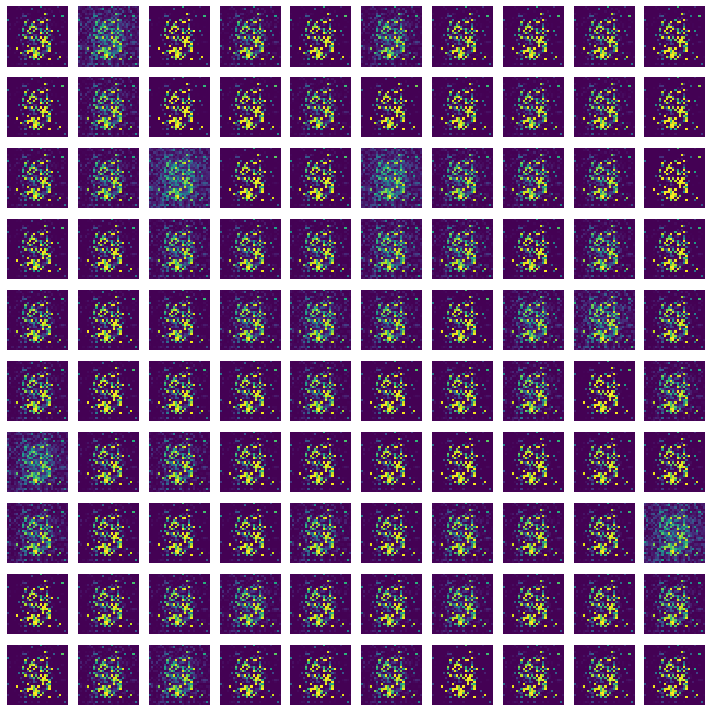

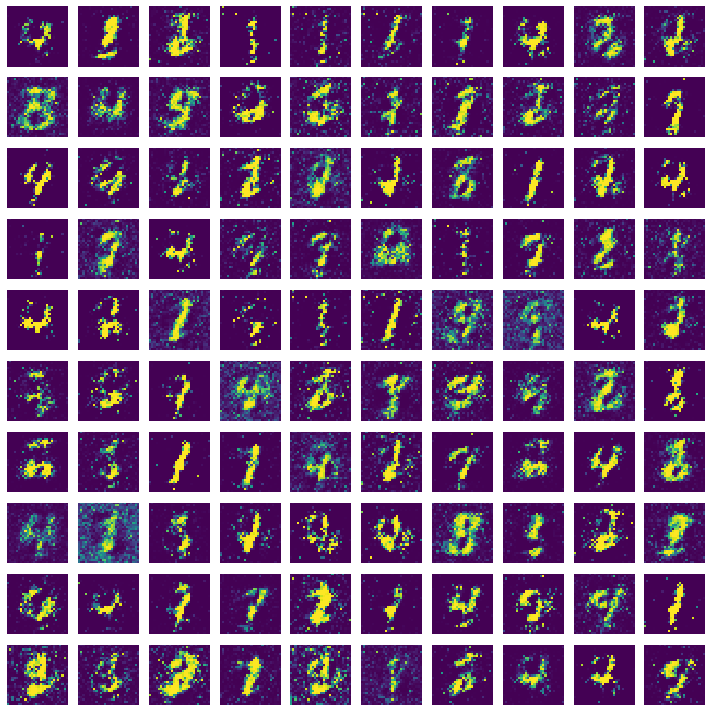

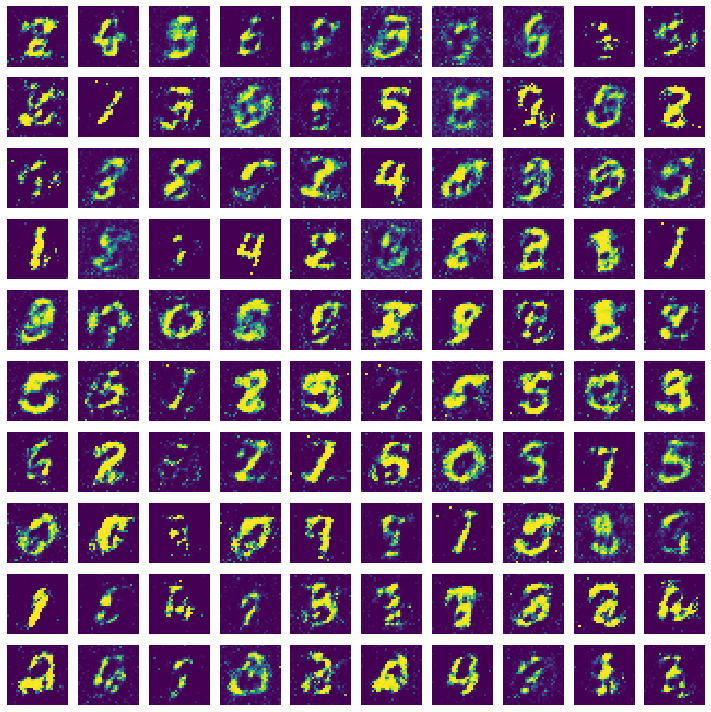

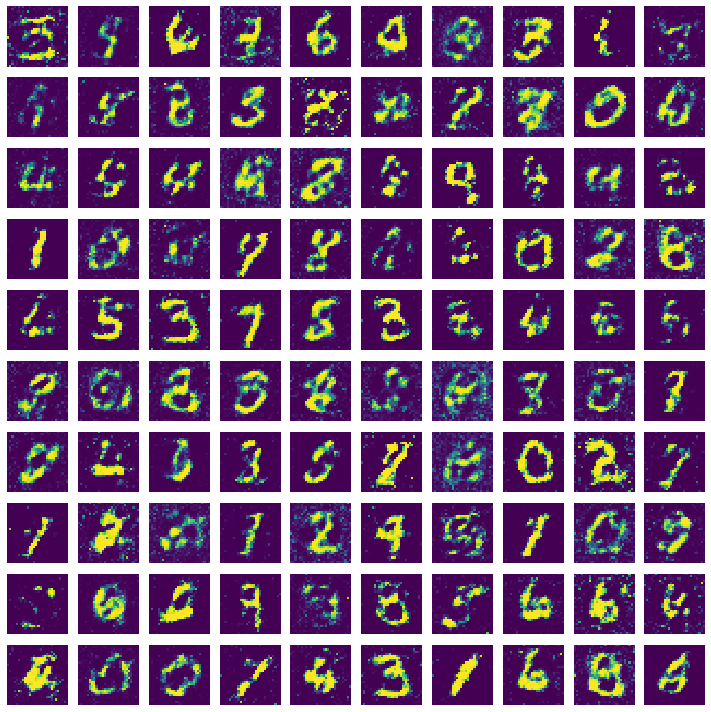

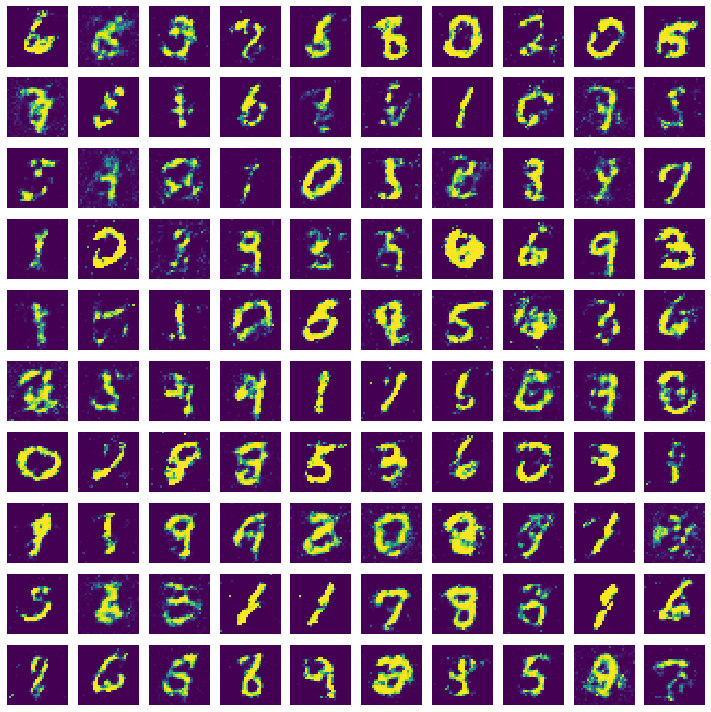

...

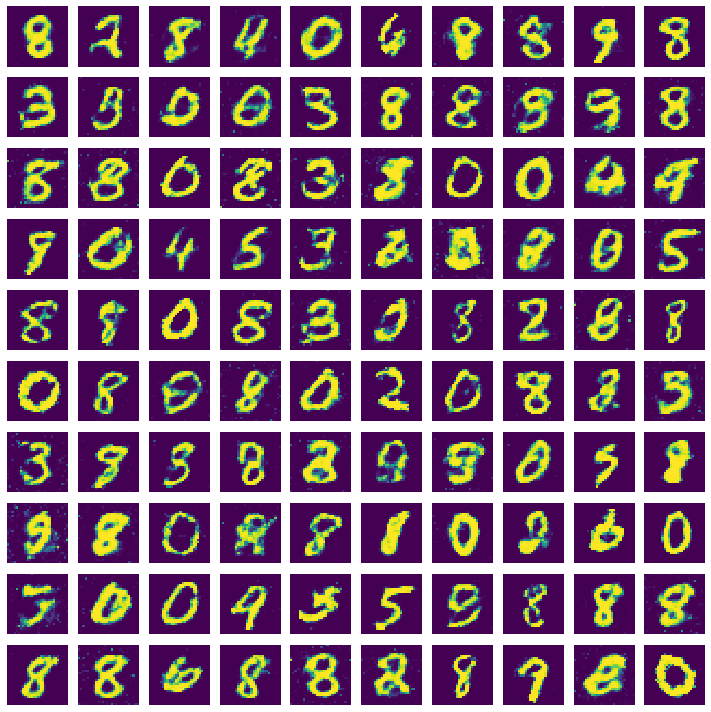

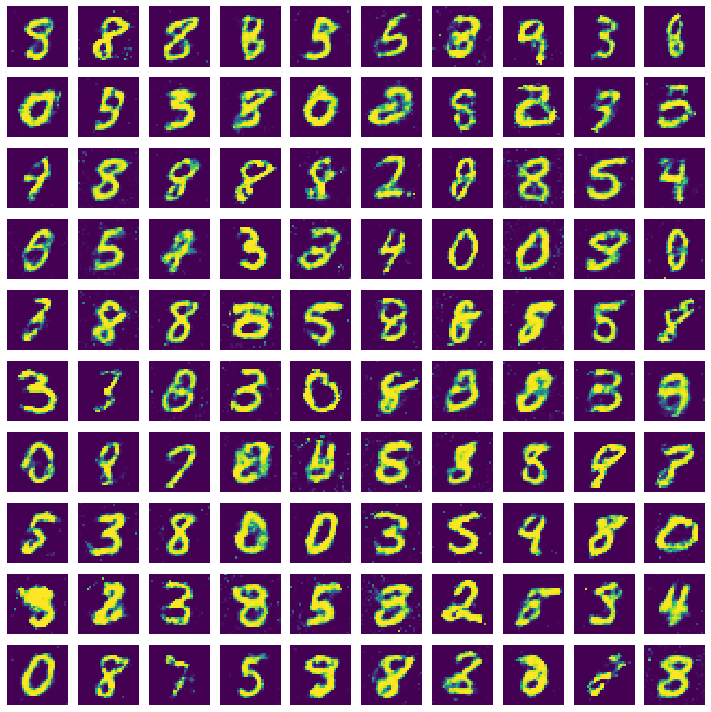

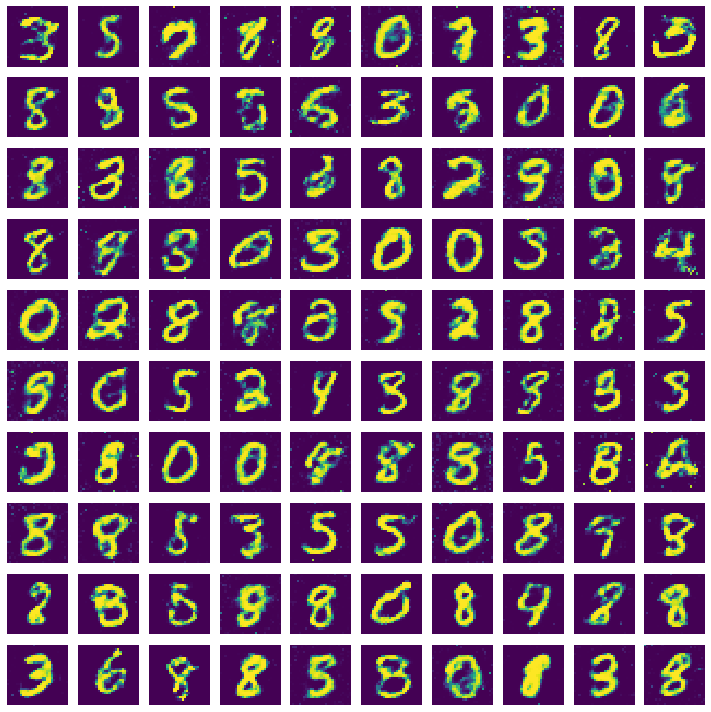

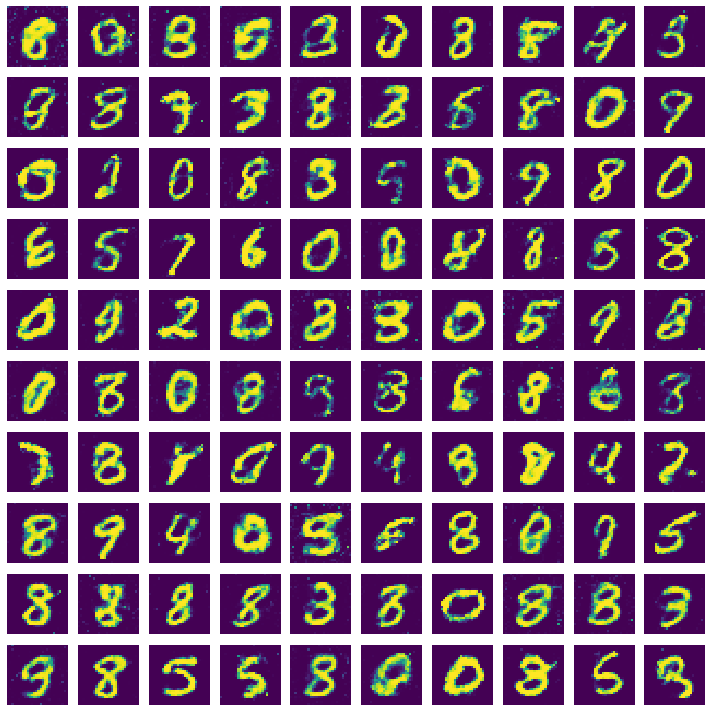

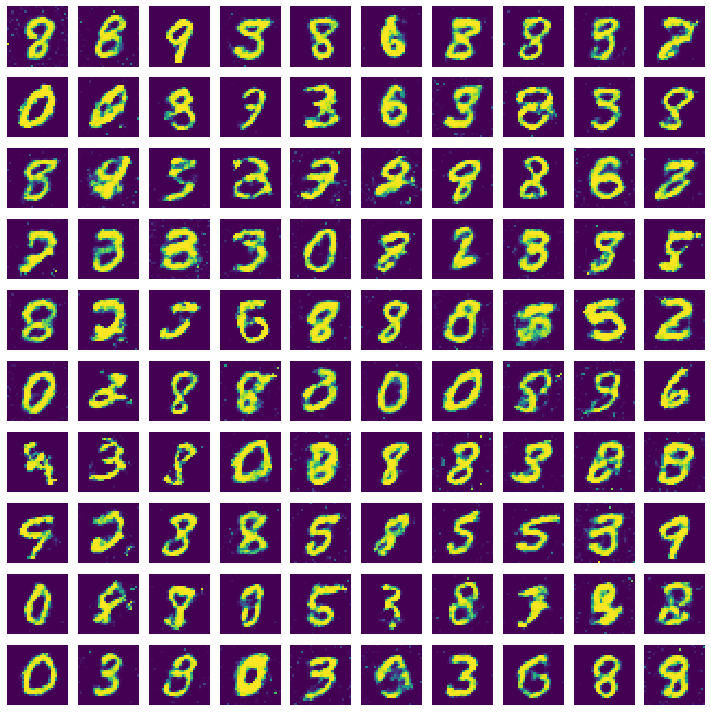

In [ ]:
generated_images,GAN = training(1500
                            ,128)


In [ ]:
generated_images,GAN = training(1800
                            ,120)

  0%|          | 0/120 [00:00<?, ?it/s]

Epoch 1


  2%|▏         | 2/120 [00:00<00:05, 19.75it/s]

Epoch 2


  2%|▎         | 3/120 [00:00<00:05, 21.22it/s]

Epoch 3


  2%|▏         | 2/120 [00:00<00:06, 19.18it/s]

Epoch 4


  2%|▎         | 3/120 [00:00<00:05, 20.05it/s]

Epoch 5


  2%|▎         | 3/120 [00:00<00:05, 21.18it/s]

Epoch 6


  2%|▎         | 3/120 [00:00<00:05, 20.25it/s]

Epoch 7


  2%|▎         | 3/120 [00:00<00:05, 20.66it/s]

Epoch 8


  2%|▎         | 3/120 [00:00<00:05, 20.55it/s]

Epoch 9


  2%|▎         | 3/120 [00:00<00:05, 20.48it/s]

Epoch 10


  2%|▏         | 2/120 [00:00<00:06, 19.14it/s]

Epoch 11


  2%|▎         | 3/120 [00:00<00:05, 20.59it/s]

Epoch 12


  2%|▎         | 3/120 [00:00<00:05, 20.19it/s]

Epoch 13


  2%|▎         | 3/120 [00:00<00:05, 21.21it/s]

Epoch 14


  2%|▎         | 3/120 [00:00<00:05, 20.47it/s]

Epoch 15


  2%|▎         | 3/120 [00:00<00:05, 20.32it/s]

Epoch 16


  2%|▏         | 2/120 [00:00<00:06, 19.64it/s]

Epoch 17


  2%|▎         | 3/120 [00:00<00:05, 20.47it/s]

Epoch 18


  2%|▎         | 3/120 [00:00<00:05, 20.73it/s]

Epoch 19


  2%|▎         | 3/120 [00:00<00:05, 21.56it/s]

Epoch 20


  2%|▏         | 2/120 [00:00<00:06, 18.47it/s]

Epoch 21


  2%|▏         | 2/120 [00:00<00:06, 18.77it/s]

Epoch 22


  2%|▎         | 3/120 [00:00<00:05, 21.24it/s]

Epoch 23


  2%|▎         | 3/120 [00:00<00:05, 21.84it/s]

Epoch 24


  2%|▎         | 3/120 [00:00<00:05, 20.32it/s]

Epoch 25


  2%|▎         | 3/120 [00:00<00:05, 20.60it/s]

Epoch 26


  2%|▏         | 2/120 [00:00<00:06, 19.66it/s]

Epoch 27


  2%|▏         | 2/120 [00:00<00:06, 18.63it/s]

Epoch 28


  2%|▎         | 3/120 [00:00<00:05, 20.11it/s]

Epoch 29


  2%|▎         | 3/120 [00:00<00:05, 21.30it/s]

Epoch 30


  2%|▏         | 2/120 [00:00<00:06, 18.63it/s]

Epoch 31


  2%|▎         | 3/120 [00:00<00:05, 21.14it/s]

Epoch 32


  2%|▎         | 3/120 [00:00<00:05, 21.21it/s]

Epoch 33


  2%|▏         | 2/120 [00:00<00:06, 19.24it/s]

Epoch 34


  2%|▎         | 3/120 [00:00<00:05, 20.28it/s]

Epoch 35


  2%|▎         | 3/120 [00:00<00:05, 21.69it/s]

Epoch 36


  2%|▎         | 3/120 [00:00<00:05, 20.40it/s]

Epoch 37


  2%|▎         | 3/120 [00:00<00:05, 20.46it/s]

Epoch 38


  2%|▏         | 2/120 [00:00<00:05, 19.80it/s]

Epoch 39


  2%|▏         | 2/120 [00:00<00:05, 19.85it/s]

Epoch 40


  2%|▎         | 3/120 [00:00<00:05, 20.63it/s]

Epoch 41


  2%|▎         | 3/120 [00:00<00:05, 19.98it/s]

Epoch 42


  2%|▏         | 2/120 [00:00<00:05, 19.92it/s]

Epoch 43


  2%|▎         | 3/120 [00:00<00:05, 21.01it/s]

Epoch 44


  2%|▎         | 3/120 [00:00<00:05, 20.15it/s]

Epoch 45


  2%|▎         | 3/120 [00:00<00:05, 21.52it/s]

Epoch 46


  2%|▏         | 2/120 [00:00<00:05, 19.88it/s]

Epoch 47


  2%|▎         | 3/120 [00:00<00:05, 20.25it/s]

Epoch 48


  2%|▎         | 3/120 [00:00<00:05, 20.91it/s]

Epoch 49


  2%|▎         | 3/120 [00:00<00:05, 20.60it/s]

Epoch 50


  2%|▎         | 3/120 [00:00<00:05, 20.27it/s]

Epoch 51


  2%|▎         | 3/120 [00:00<00:05, 21.50it/s]

Epoch 52


  2%|▎         | 3/120 [00:00<00:05, 20.97it/s]

Epoch 53


  2%|▎         | 3/120 [00:00<00:05, 20.36it/s]

Epoch 54


  2%|▎         | 3/120 [00:00<00:05, 21.47it/s]

Epoch 55


  2%|▎         | 3/120 [00:00<00:05, 21.31it/s]

Epoch 56


  2%|▎         | 3/120 [00:00<00:05, 19.79it/s]

Epoch 57


  2%|▎         | 3/120 [00:00<00:05, 21.62it/s]

Epoch 58


  2%|▎         | 3/120 [00:00<00:05, 20.87it/s]

Epoch 59


  2%|▎         | 3/120 [00:00<00:05, 21.00it/s]

Epoch 60


  2%|▎         | 3/120 [00:00<00:05, 20.72it/s]

Epoch 61


  2%|▎         | 3/120 [00:00<00:05, 20.84it/s]

Epoch 62


  2%|▎         | 3/120 [00:00<00:05, 20.44it/s]

Epoch 63


  2%|▎         | 3/120 [00:00<00:05, 21.75it/s]

Epoch 64


  2%|▎         | 3/120 [00:00<00:05, 21.07it/s]

Epoch 65


  2%|▏         | 2/120 [00:00<00:06, 18.66it/s]

Epoch 66


  2%|▎         | 3/120 [00:00<00:05, 21.47it/s]

Epoch 67


  2%|▎         | 3/120 [00:00<00:05, 21.34it/s]

Epoch 68


  2%|▏         | 2/120 [00:00<00:06, 18.56it/s]

Epoch 69


  2%|▏         | 2/120 [00:00<00:05, 19.93it/s]

Epoch 70


  2%|▎         | 3/120 [00:00<00:05, 20.84it/s]

Epoch 71


  2%|▎         | 3/120 [00:00<00:05, 21.04it/s]

Epoch 72


  2%|▎         | 3/120 [00:00<00:05, 20.82it/s]

Epoch 73


  2%|▏         | 2/120 [00:00<00:06, 19.65it/s]

Epoch 74


  2%|▏         | 2/120 [00:00<00:05, 19.73it/s]

Epoch 75


  2%|▎         | 3/120 [00:00<00:05, 21.65it/s]

Epoch 76


  2%|▎         | 3/120 [00:00<00:05, 21.53it/s]

Epoch 77


  2%|▏         | 2/120 [00:00<00:06, 18.07it/s]

Epoch 78


  2%|▎         | 3/120 [00:00<00:05, 20.93it/s]

Epoch 79


  2%|▎         | 3/120 [00:00<00:05, 21.62it/s]

Epoch 80


  2%|▎         | 3/120 [00:00<00:05, 20.67it/s]

Epoch 81


  2%|▎         | 3/120 [00:00<00:05, 21.21it/s]

Epoch 82


  2%|▏         | 2/120 [00:00<00:06, 17.54it/s]

Epoch 83


  2%|▎         | 3/120 [00:00<00:05, 21.18it/s]

Epoch 84


  2%|▎         | 3/120 [00:00<00:05, 21.17it/s]

Epoch 85


  2%|▏         | 2/120 [00:00<00:06, 19.60it/s]

Epoch 86


 41%|████      | 49/120 [00:02<00:03, 20.34it/s]

In [ ]:
generated_images

array([[[-0.99999624, -0.99989974, -0.9999776 , ..., -0.9999298 ,
         -0.99999416, -0.9999942 ],
        [-0.9997999 , -0.99995303, -0.9999933 , ..., -0.99999267,
         -0.9999933 , -0.9996133 ],
        [-0.99999654, -0.9972948 , -0.99949604, ..., -0.99990857,
         -0.9951003 , -0.9997411 ],
        ...,
        [-0.99999976, -0.9993257 , -0.99999833, ..., -0.9999998 ,
         -0.999994  , -0.99948186],
        [-0.99998355, -0.9999817 , -0.999717  , ..., -0.9999997 ,
         -0.9999969 , -0.99824077],
        [-0.99973917, -0.99998087, -0.9999871 , ..., -1.        ,
         -0.99999607, -0.99994296]],

       [[-0.9961525 , -0.9999956 , -0.9915491 , ..., -0.9995841 ,
         -0.99912065, -0.9994304 ],
        [-0.9995613 , -0.99873704, -0.9998727 , ..., -0.9999335 ,
         -0.9999805 , -0.98965275],
        [-0.99846613, -0.9960572 , -0.9823117 , ..., -0.99649894,
         -0.9996717 , -0.9977108 ],
        ...,
        [-0.99293625, -0.99957687, -0.9970308 , ..., -

Generated images through decoder

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


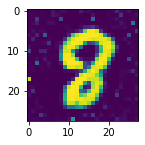

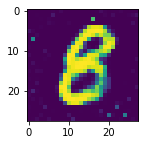

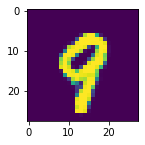

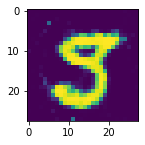

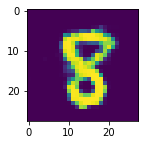

...

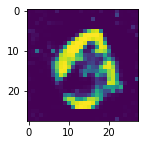

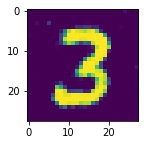

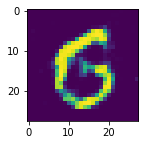

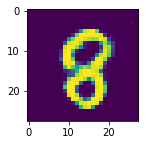

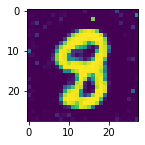

In [ ]:
for i in range(len(generated_images)):
  plt.figure(figsize=(2,5))
  plt.imshow(generated_images[i])

In [ ]:
#Classification
from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPool2D, Flatten,UpSampling2D
from keras.utils import np_utils
from keras.datasets import mnist


In [ ]:
from sklearn.metrics import accuracy_score,fbeta_score


In [ ]:



(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.reshape(x_train.shape[0], 28, 28, 1)
x_test = x_test.reshape(x_test.shape[0], 28, 28, 1)
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

In [ ]:
x_train /= 255
x_test /= 255

In [ ]:
# one-hot encoding using keras' numpy-related utilities
n_classes = 10
print("Shape before one-hot encoding: ", y_train.shape)
y_train = np_utils.to_categorical(y_train, n_classes)
y_test = np_utils.to_categorical(y_test, n_classes)
print("Shape after one-hot encoding: ", y_train.shape)

Shape before one-hot encoding:  (60000,)
Shape after one-hot encoding:  (60000, 10)


In [ ]:
# building a linear stack of layers with the sequential model
model = Sequential()
# convolutional layer
model.add(Conv2D(128, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu', input_shape=(28,28,1)))
model.add(MaxPool2D(pool_size=(1,1)))
model.add(Conv2D(64, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu', input_shape=(28,28,1)))
model.add(MaxPool2D(pool_size=(1,1)))

# flatten output of conv
model.add(Flatten())
# hidden layer
model.add(Dense(100, activation='relu'))
# output layer
model.add(Dense(10, activation='softmax'))

In [ ]:
# compiling the sequential model
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
# training the model for 10 epochs
model.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
469/469 [==============================] - 7s 15ms/step - loss: 0.1307 - accuracy: 0.9607 - val_loss: 0.0528 - val_accuracy: 0.9822
Epoch 2/50
469/469 [==============================] - 7s 15ms/step - loss: 0.0371 - accuracy: 0.9883 - val_loss: 0.0398 - val_accuracy: 0.9857
Epoch 3/50
469/469 [==============================] - 7s 15ms/step - loss: 0.0224 - accuracy: 0.9925 - val_loss: 0.0392 - val_accuracy: 0.9871
Epoch 4/50
469/469 [==============================] - 7s 15ms/step - loss: 0.0128 - accuracy: 0.9954 - val_loss: 0.0555 - val_accuracy: 0.9844
Epoch 5/50
469/469 [==============================] - 7s 15ms/step - loss: 0.0093 - accuracy: 0.9968 - val_loss: 0.0449 - val_accuracy: 0.9880
Epoch 6/50
469/469 [==============================] - 7s 15ms/step - loss: 0.0073 - accuracy: 0.9975 - val_loss: 0.0562 - val_accuracy: 0.9851
Epoch 7/50
469/469 [==============================] - 7s 15ms/step - loss: 0.0057 - accuracy: 0.9980 - val_loss: 0.0507 - val_accuracy: 0.9881

In [ ]:
generated_images1 = generated_images.reshape(generated_images.shape[0],28,28,1)

In [ ]:
generated_images1 = generated_images1.astype('float32')


In [ ]:
generated_images1

array([[[[-0.9977514 ],
         [-0.9809567 ],
         [-0.99712276],
         ...,
         [-0.90120095],
         [-0.99913466],
         [-0.99081767]],

        [[-0.98880106],
         [-0.9714676 ],
         [-0.97840834],
         ...,
         [-0.9996308 ],
         [-0.99094087],
         [-0.92067957]],

        [[-0.99497944],
         [-0.985133  ],
         [-0.6855494 ],
         ...,
         [-0.99534696],
         [-0.9827088 ],
         [-0.99857277]],

        ...,

        [[-0.99362946],
         [-0.91557187],
         [-0.9881316 ],
         ...,
         [-0.9487593 ],
         [-0.99976104],
         [-0.97638214]],

        [[-0.97040004],
         [-0.98843354],
         [-0.9988968 ],
         ...,
         [-0.99771124],
         [-0.99823654],
         [-0.97849804]],

        [[-0.9983555 ],
         [-0.9763599 ],
         [-0.9739622 ],
         ...,
         [-0.9943384 ],
         [-0.97975945],
         [-0.93555576]]],


       [[[-0.9997389 ],


In [ ]:
pred = model.predict(generated_images1)

In [ ]:
pred

array([[0.00000000e+00, 0.00000000e+00, 7.81209190e-13, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        1.00000000e+00, 3.31738306e-31],
       [1.11931729e-33, 0.00000000e+00, 6.20128236e-31, 1.18095582e-31,
        2.38765378e-31, 8.13262669e-27, 3.26817181e-15, 0.00000000e+00,
        1.00000000e+00, 5.12697811e-25],
       [0.00000000e+00, 4.77189883e-37, 0.00000000e+00, 0.00000000e+00,
        6.21243904e-37, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        9.90612278e-35, 1.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 6.31641204e-22,
        0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        3.80672166e-24, 3.40697476e-18],
       [0.00000000e+00, 0.00000000e+00, 6.44553758e-30, 6.09702861e-35,
        0.00000000e+00, 5.93617930e-25, 0.00000000e+00, 0.00000000e+00,
        1.00000000e+00, 0.00000000e+00],
       [9.18822612e-21, 2.39841278e-34, 3.45393852e-34, 3.34682556e-36,
   

In [ ]:
for i in range(len(pred)):
  for j in range(10):
    if pred[i][j]>0.5:
      pred[i][j]=1
    else:
      pred[i][j]=0

In [ ]:
pred1 = pred.argmax(axis=1)

In [ ]:
pred1

array([8, 8, 9, 5, 8, 6, 8, 8, 9, 2, 0, 0, 8, 2, 3, 6, 3, 2, 3, 8, 5, 4,
       5, 3, 3, 2, 9, 2, 6, 2, 7, 2, 3, 3, 0, 2, 2, 3, 5, 5, 8, 2, 5, 5,
       8, 8, 5, 8, 5, 2, 0, 2, 8, 8, 3, 0, 0, 8, 3, 6, 4, 3, 3, 0, 8, 8,
       8, 3, 8, 8, 9, 2, 3, 8, 5, 8, 5, 5, 3, 9, 0, 8, 8, 2, 5, 3, 8, 3,
       9, 2, 0, 3, 3, 0, 3, 9, 3, 5, 8, 8])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


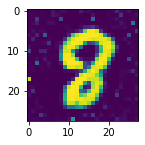

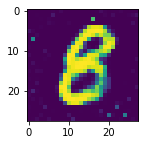

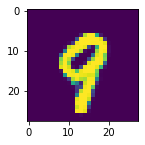

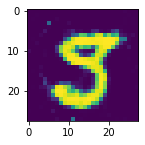

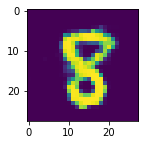

...

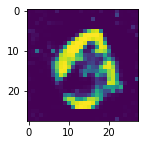

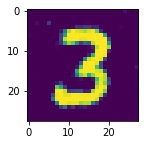

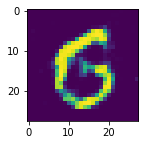

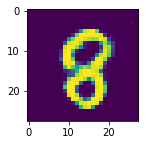

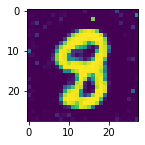

In [ ]:
for i in range(len(generated_images)):
  plt.figure(figsize=(2,5))
  plt.imshow(generated_images[i])
                            

In [ ]:
#For predicting labels of generated images


In [ ]:
y_true = np.array([8,8,9,5,8,6,8,8,3,2,0,0,3,7,3,6,3,8,3,8,8,9,5,3,3,8,8,8,6,3,7,3,3,3,0,8,2,3,5,5,8,2,5,6,8,8,8,5,5,2,0,2,8,6,3,0,0,8,9,6,4,3,8,0,0,8,8,3,8,8,9,2,3,8,5,8,5,5,3,9,0,8,8,0,5,3,8,3,3,8,0,3,3,0,3,3,3,6,8,8])

In [ ]:
y_true.shape

(100,)

In [ ]:
pred1 = np.array([8, 8, 9, 5, 8, 6, 8, 8, 9, 2, 0, 0, 8, 2, 3, 6, 3, 2, 3, 8, 5, 4,
       5, 3, 3, 2, 9, 2, 6, 2, 7, 2, 3, 3, 0, 2, 2, 3, 5, 5, 8, 2, 5, 5,
       8, 8, 5, 8, 5, 2, 0, 2, 8, 8, 3, 0, 0, 8, 3, 6, 4, 3, 3, 0, 8, 8,
       8, 3, 8, 8, 9, 2, 3, 8, 5, 8, 5, 5, 3, 9, 0, 8, 8, 2, 5, 3, 8, 3,
       9, 2, 0, 3, 3, 0, 3, 9, 3, 5, 8, 8])

In [ ]:
#f2 score
import sklearn
sklearn.metrics.fbeta_score(y_true,pred1,beta=2,average='micro'  )

In [ ]:
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer

In [ ]:
from sklearn.model_selection import KFold


In [ ]:
n_split=3

In [ ]:
from sklearn.model_selection import KFold

n_split=5

for train_index,val_index in KFold(n_split).split(X_train):
  x_train,x_validation=X_train[train_index],X_train[val_index]
  y_train,y_validation=Y_train[train_index],Y_train[val_index]
  

  model.fit(x_train, y_train,epochs=20)
  
  print('Model evaluation ',model.evaluate(x_validation,y_validation))

In [ ]:
accuracy_average = (0.9886999726295471+0.9887999892234802+0.9886999726295471+0.9887999892234802+ 0.9887999892234802)/5

In [ ]:
loss_average = (0.40428656339645386+0.40583860874176025+0.3987242579460144+0.3940199017524719+0.3901006281375885)/5

In [ ]:
#print(accuracy_average)

In [ ]:
#print(loss_average)

Performed K-fold cross validation

In [ ]:
from sklearn.model_selection import KFold

n_split=5

for train_index,test_index in KFold(n_split).split(X_train):
  x_train,x_test=X_train[train_index],X_train[test_index]
  y_train,y_test=Y_train[train_index],Y_train[test_index]
  

  model.fit(X_train, Y_train,epochs=20)
  
  print('Model evaluation ',model.evaluate(generated_images1,pred))

In [ ]:
generated_images.shape

In [ ]:
from sklearn.metrics import accuracy_score

Accuracy score between manually assigned labels and predicted labels through classification model

In [ ]:
accuracy_score(pred1,y_true)

0.76

#Auto encoders

In [ ]:

import keras
from keras import layers
# This is the size of our encoded representations
encoding_dim = 32  # 32 floats -> compression of factor 24.5, assuming the input is 784 floats

# This is our input image
input_img = keras.Input(shape=(784,))
encoded = layers.Dense(encoding_dim, activation='relu')(input_img)
decoded = layers.Dense(784, activation='sigmoid')(encoded)

# This model maps an input to its reconstruction
autoencoder = keras.Model(input_img, decoded)

In [ ]:
encoder = keras.Model(input_img, encoded)

In [ ]:
# This is our encoded (32-dimensional) input
encoded_input = keras.Input(shape=(encoding_dim,))
# Retrieve the last layer of the autoencoder model
decoder_layer = autoencoder.layers[-1]
# Create the decoder model
decoder = keras.Model(encoded_input, decoder_layer(encoded_input))

In [ ]:
autoencoder.compile(optimizer='adam', loss='categorical_crossentropy',metrics='accuracy')


In [ ]:
from keras.datasets import mnist
import numpy as np
(x_train, y_train), (x_test, y_test) = mnist.load_data()

In [ ]:
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.

In [ ]:
x_train.shape

(60000, 28, 28)

In [ ]:
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))
print(x_train.shape)
print(x_test.shape)

(60000, 784)
(10000, 784)


In [ ]:
autoencoder.fit(x_train, x_train,
                epochs=50,
                batch_size=256,
                shuffle=True,
                validation_data=(x_test, x_test))

Epoch 1/50
235/235 [==============================] - 1s 6ms/step - loss: 591.6503 - accuracy: 0.0083 - val_loss: 572.3585 - val_accuracy: 0.0177
Epoch 2/50
235/235 [==============================] - 1s 5ms/step - loss: 552.9615 - accuracy: 0.0192 - val_loss: 550.5527 - val_accuracy: 0.0190
Epoch 3/50
235/235 [==============================] - 1s 5ms/step - loss: 537.1328 - accuracy: 0.0145 - val_loss: 539.9572 - val_accuracy: 0.0143
Epoch 4/50
235/235 [==============================] - 1s 5ms/step - loss: 529.4142 - accuracy: 0.0131 - val_loss: 534.5138 - val_accuracy: 0.0143
Epoch 5/50
235/235 [==============================] - 1s 5ms/step - loss: 525.3286 - accuracy: 0.0131 - val_loss: 531.5344 - val_accuracy: 0.0143
Epoch 6/50
235/235 [==============================] - 1s 5ms/step - loss: 522.9088 - accuracy: 0.0131 - val_loss: 529.6239 - val_accuracy: 0.0143
Epoch 7/50
235/235 [==============================] - 1s 5ms/step - loss: 521.2927 - accuracy: 0.0131 - val_loss: 528.3164 -

In [ ]:
# Encode and decode some digits
# Note that we take them from the *test* set
encoded_imgs = encoder.predict(x_test)
decoded_imgs = decoder.predict(encoded_imgs)

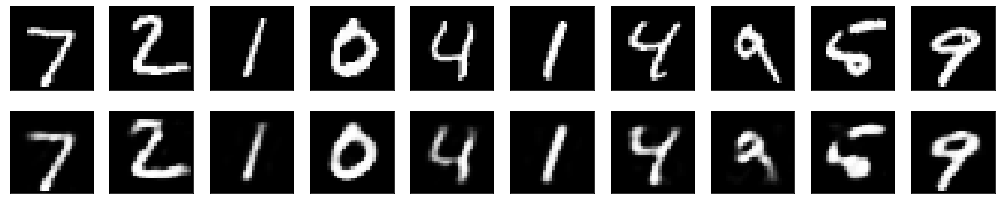

In [ ]:
# Use Matplotlib (don't ask)
import matplotlib.pyplot as plt

n = 10  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
encoded_imgs.shape

(10000, 32)

The clusters do not look well separated

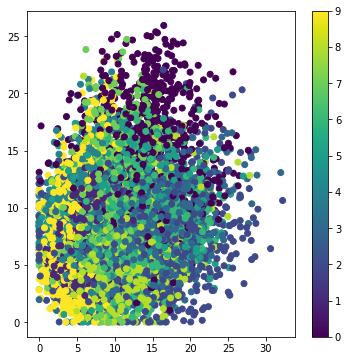

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(6, 6))
plt.scatter(encoded_imgs[:,0], encoded_imgs[:,1], c=y_test)
plt.colorbar()

plt.show()


#Variational auto-encoder

#VAE

In [1]:
img_size = 28
num_channels = 1
latent_space_dim = 2

Encoder Model

In [2]:
import tensorflow
x = tensorflow.keras.layers.Input(shape=(img_size, img_size, num_channels), name="encoder_input")

encoder_conv_layer1 = tensorflow.keras.layers.Conv2D(filters=1, kernel_size=(3, 3), padding="same", strides=1, name="encoder_conv_1")(x)
encoder_norm_layer1 = tensorflow.keras.layers.BatchNormalization(name="encoder_norm_1")(encoder_conv_layer1)
encoder_activ_layer1 = tensorflow.keras.layers.LeakyReLU(name="encoder_leakyrelu_1")(encoder_norm_layer1)

encoder_conv_layer2 = tensorflow.keras.layers.Conv2D(filters=32, kernel_size=(3,3), padding="same", strides=1, name="encoder_conv_2")(encoder_activ_layer1)
encoder_norm_layer2 = tensorflow.keras.layers.BatchNormalization(name="encoder_norm_2")(encoder_conv_layer2)
encoder_activ_layer2 = tensorflow.keras.layers.LeakyReLU(name="encoder_activ_layer_2")(encoder_norm_layer2)

encoder_conv_layer3 = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(3,3), padding="same", strides=2, name="encoder_conv_3")(encoder_activ_layer2)
encoder_norm_layer3 = tensorflow.keras.layers.BatchNormalization(name="encoder_norm_3")(encoder_conv_layer3)
encoder_activ_layer3 = tensorflow.keras.layers.LeakyReLU(name="encoder_activ_layer_3")(encoder_norm_layer3)

encoder_conv_layer4 = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(3,3), padding="same", strides=2, name="encoder_conv_4")(encoder_activ_layer3)
encoder_norm_layer4 = tensorflow.keras.layers.BatchNormalization(name="encoder_norm_4")(encoder_conv_layer4)
encoder_activ_layer4 = tensorflow.keras.layers.LeakyReLU(name="encoder_activ_layer_4")(encoder_norm_layer4)

encoder_conv_layer5 = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(3,3), padding="same", strides=1, name="encoder_conv_5")(encoder_activ_layer4)
encoder_norm_layer5 = tensorflow.keras.layers.BatchNormalization(name="encoder_norm_5")(encoder_conv_layer5)
encoder_activ_layer5 = tensorflow.keras.layers.LeakyReLU(name="encoder_activ_layer_5")(encoder_norm_layer5)

shape_before_flatten = tensorflow.keras.backend.int_shape(encoder_activ_layer5)[1:]
encoder_flatten = tensorflow.keras.layers.Flatten()(encoder_activ_layer5)

encoder_mu = tensorflow.keras.layers.Dense(units=latent_space_dim, name="encoder_mu")(encoder_flatten)
encoder_log_variance = tensorflow.keras.layers.Dense(units=latent_space_dim, name="encoder_log_variance")(encoder_flatten)

encoder_mu_log_variance_model = tensorflow.keras.models.Model(x, (encoder_mu, encoder_log_variance), name="encoder_mu_log_variance_model")

def sampling(mu_log_variance):
    mu, log_variance = mu_log_variance
    epsilon = tensorflow.keras.backend.random_normal(shape=tensorflow.keras.backend.shape(mu), mean=0.0, stddev=1.0)
    random_sample = mu + tensorflow.keras.backend.exp(log_variance/2) * epsilon
    return random_sample

encoder_output = tensorflow.keras.layers.Lambda(sampling, name="encoder_output")([encoder_mu, encoder_log_variance])

encoder = tensorflow.keras.models.Model(x, encoder_output, name="encoder_model")
encoder.summary()


Model: "encoder_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input (InputLayer)      [(None, 28, 28, 1)]  0                                            
__________________________________________________________________________________________________
encoder_conv_1 (Conv2D)         (None, 28, 28, 1)    10          encoder_input[0][0]              
__________________________________________________________________________________________________
encoder_norm_1 (BatchNormalizat (None, 28, 28, 1)    4           encoder_conv_1[0][0]             
__________________________________________________________________________________________________
encoder_leakyrelu_1 (LeakyReLU) (None, 28, 28, 1)    0           encoder_norm_1[0][0]             
______________________________________________________________________________________

In [3]:
decoder_input = tensorflow.keras.layers.Input(shape=(latent_space_dim), name="decoder_input")


In [4]:
import numpy as np
decoder_dense_layer1 = tensorflow.keras.layers.Dense(units=np.prod(shape_before_flatten), name="decoder_dense_1")(decoder_input)


In [5]:
decoder_reshape = tensorflow.keras.layers.Reshape(target_shape=shape_before_flatten)(decoder_dense_layer1)


Decoder Model


In [6]:
decoder_conv_tran_layer1 = tensorflow.keras.layers.Conv2DTranspose(filters=64, kernel_size=(3, 3), padding="same", strides=1, name="decoder_conv_tran_1")(decoder_reshape)
decoder_norm_layer1 = tensorflow.keras.layers.BatchNormalization(name="decoder_norm_1")(decoder_conv_tran_layer1)
decoder_activ_layer1 = tensorflow.keras.layers.LeakyReLU(name="decoder_leakyrelu_1")(decoder_norm_layer1)

decoder_conv_tran_layer2 = tensorflow.keras.layers.Conv2DTranspose(filters=64, kernel_size=(3, 3), padding="same", strides=2, name="decoder_conv_tran_2")(decoder_activ_layer1)
decoder_norm_layer2 = tensorflow.keras.layers.BatchNormalization(name="decoder_norm_2")(decoder_conv_tran_layer2)
decoder_activ_layer2 = tensorflow.keras.layers.LeakyReLU(name="decoder_leakyrelu_2")(decoder_norm_layer2)

decoder_conv_tran_layer3 = tensorflow.keras.layers.Conv2DTranspose(filters=64, kernel_size=(3, 3), padding="same", strides=2, name="decoder_conv_tran_3")(decoder_activ_layer2)
decoder_norm_layer3 = tensorflow.keras.layers.BatchNormalization(name="decoder_norm_3")(decoder_conv_tran_layer3)
decoder_activ_layer3 = tensorflow.keras.layers.LeakyReLU(name="decoder_leakyrelu_3")(decoder_norm_layer3)

decoder_conv_tran_layer4 = tensorflow.keras.layers.Conv2DTranspose(filters=1, kernel_size=(3, 3), padding="same", strides=1, name="decoder_conv_tran_4")(decoder_activ_layer3)
decoder_output = tensorflow.keras.layers.LeakyReLU(name="decoder_output")(decoder_conv_tran_layer4 )


In [7]:
decoder = tensorflow.keras.models.Model(decoder_input, decoder_output, name="decoder_model")


In [8]:
decoder.summary()

Model: "decoder_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
decoder_input (InputLayer)   [(None, 2)]               0         
_________________________________________________________________
decoder_dense_1 (Dense)      (None, 3136)              9408      
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 64)          0         
_________________________________________________________________
decoder_conv_tran_1 (Conv2DT (None, 7, 7, 64)          36928     
_________________________________________________________________
decoder_norm_1 (BatchNormali (None, 7, 7, 64)          256       
_________________________________________________________________
decoder_leakyrelu_1 (LeakyRe (None, 7, 7, 64)          0         
_________________________________________________________________
decoder_conv_tran_2 (Conv2DT (None, 14, 14, 64)      

Defining loss functions 

In [9]:
def loss_func(encoder_mu, encoder_log_variance):
    def vae_reconstruction_loss(y_true, y_predict):
        reconstruction_loss_factor = 1000
        reconstruction_loss = tensorflow.keras.backend.mean(tensorflow.keras.backend.square(y_true-y_predict), axis=[1, 2, 3])
        return reconstruction_loss_factor * reconstruction_loss

    def vae_kl_loss(encoder_mu, encoder_log_variance):
        kl_loss = -0.5 * tensorflow.keras.backend.sum(1.0 + encoder_log_variance - tensorflow.keras.backend.square(encoder_mu) - tensorflow.keras.backend.exp(encoder_log_variance), axis=1)
        return kl_loss

    def vae_kl_loss_metric(y_true, y_predict):
        kl_loss = -0.5 * tensorflow.keras.backend.sum(1.0 + encoder_log_variance - tensorflow.keras.backend.square(encoder_mu) - tensorflow.keras.backend.exp(encoder_log_variance), axis=1)
        return kl_loss

    def vae_loss(y_true, y_predict):
        reconstruction_loss = vae_reconstruction_loss(y_true, y_predict)
        kl_loss = vae_kl_loss(y_true, y_predict)

        loss = reconstruction_loss + kl_loss
        return loss

    return vae_loss

Creating an Auto-encoder model

In [10]:
vae_input = tensorflow.keras.layers.Input(shape=(img_size, img_size, num_channels), name="VAE_input")
vae_encoder_output = encoder(vae_input)
vae_decoder_output = decoder(vae_encoder_output)
vae = tensorflow.keras.models.Model(vae_input, vae_decoder_output, name="VAE")
vae.compile(optimizer=tensorflow.keras.optimizers.Adam(lr=0.0005), loss=loss_func(encoder_mu, encoder_log_variance))  #change lr


In [11]:
(x_train, y_train), (x_test, y_test) = tensorflow.keras.datasets.mnist.load_data() 
x_train = x_train.astype("float32") / 255.0
x_test = x_test.astype("float32") / 255.0

11493376/11490434 [==============================] - 0s 0us/step


In [12]:
x_train = np.reshape(x_train, newshape=(x_train.shape[0], x_train.shape[1], x_train.shape[2], 1)) 
x_test = np.reshape(x_test, newshape=(x_test.shape[0], x_train.shape[1], x_train.shape[2], 1))

In [13]:
vae.fit(x_train, x_train, epochs=150, batch_size=128, shuffle=True, validation_data=(x_test, x_test))


Epoch 1/150
469/469 [==============================] - 10s 21ms/step - loss: 71.6982 - val_loss: 61.4260
Epoch 2/150
469/469 [==============================] - 9s 20ms/step - loss: 55.8634 - val_loss: 53.9148
Epoch 3/150
469/469 [==============================] - 9s 20ms/step - loss: 52.9067 - val_loss: 51.6329
Epoch 4/150
469/469 [==============================] - 9s 20ms/step - loss: 51.0134 - val_loss: 50.4102
Epoch 5/150
469/469 [==============================] - 9s 20ms/step - loss: 49.6674 - val_loss: 48.4671
Epoch 6/150
469/469 [==============================] - 10s 20ms/step - loss: 48.7774 - val_loss: 48.1960
Epoch 7/150
469/469 [==============================] - 10s 21ms/step - loss: 48.1231 - val_loss: 47.7588
Epoch 8/150
469/469 [==============================] - 10s 21ms/step - loss: 47.5552 - val_loss: 46.9918
Epoch 9/150
469/469 [==============================] - 10s 21ms/step - loss: 47.0219 - val_loss: 46.5089
Epoch 10/150
469/469 [==============================] - 10s

Use the decoder to get the reconstructed images

In [14]:
(x_train, y_train), (x_test, y_test) = tensorflow.keras.datasets.mnist.load_data()
x_test = x_test.astype("float32") / 255.0

x_test = np.reshape(x_test, newshape=(x_test.shape[0], x_train.shape[1], x_train.shape[2], 1))

encoded_data = encoder.predict(x_test)
decoded_data = decoder.predict(encoded_data)

In [15]:
encoded_data.shape

(10000, 2)

NameError: ignored

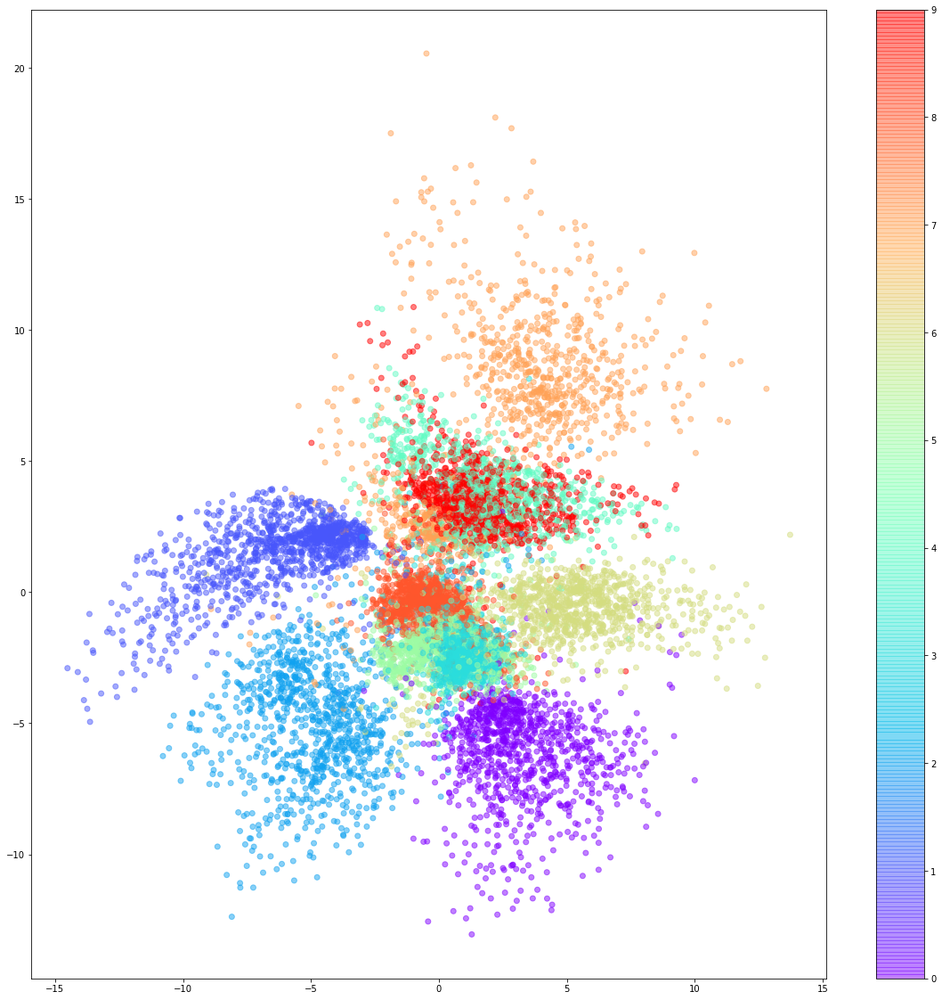

In [16]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,20))

sc=plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=y_test,cmap='rainbow',alpha=0.5 ) 
cbar = plt.colorbar(sc, ticks = range(10)) 
cbar.ax.set_yticklabels([labels.get(i) for i in range(10)]) 


In [ ]:
#en = encoded_data[1].reshape(1,2)  #We get mean and variance as the output from the encoder and and get a random sample from them, and use it to as the input of the decoder to get an image

In [22]:
def recons(a,b):
  en1 = np.array([[a,b]])
  recons = decoder.predict(en1) 
  plt.imshow(recons.reshape(28,28))

We can verify from the above plot that the point 5,15 should give a 7

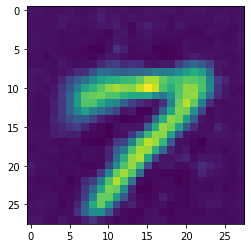

In [23]:
recons(5,15)

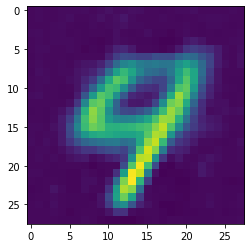

In [24]:
recons(1,5) 

We can see that in the above plot that the points of class 4 and 9 are overlapping, and so the reconstructed image seems to be quite confusing